## Importing and EDA

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns 
import sklearn
import plotly.express as px

In [2]:
df = pd.read_csv('/Users/ave/Desktop/machinelearning/wine-quality-white-and-red.csv')
df

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [3]:
display(df.info())

display(df.describe().round(2))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6497 non-null   float64
 2   volatile acidity      6497 non-null   float64
 3   citric acid           6497 non-null   float64
 4   residual sugar        6497 non-null   float64
 5   chlorides             6497 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6497 non-null   float64
 10  sulphates             6497 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


None

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00,6497.00
mean,7.22,0.34,0.32,5.44,0.06,30.53,115.74,0.99,3.22,0.53,10.49,5.82
std,1.30,0.16,0.15,4.76,0.04,17.75,56.52,0.00,0.16,0.15,1.19,0.87
min,3.80,0.08,0.00,0.60,0.01,1.00,6.00,0.99,2.72,0.22,8.00,3.00
25%,6.40,0.23,0.25,1.80,0.04,17.00,77.00,0.99,3.11,0.43,9.50,5.00
50%,7.00,0.29,0.31,3.00,0.05,29.00,118.00,0.99,3.21,0.51,10.30,6.00
75%,7.70,0.40,0.39,8.10,0.06,41.00,156.00,1.00,3.32,0.60,11.30,6.00
max,15.90,1.58,1.66,65.80,0.61,289.00,440.00,1.04,4.01,2.00,14.90,9.00


In [4]:
# change the 0 into nan
for i in range(len(df)):
    for j in range(len(df.columns)):
        if df.iloc[i, j] == 0:
            df.iloc[i, j] = np.nan

#checking null value 
display(df.isna().sum())

df.dropna(inplace=True)
df.info()



type                      0
fixed acidity             0
volatile acidity          0
citric acid             151
residual sugar            0
chlorides                 0
free sulfur dioxide       0
total sulfur dioxide      0
density                   0
pH                        0
sulphates                 0
alcohol                   0
quality                   0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
Index: 6346 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6346 non-null   object 
 1   fixed acidity         6346 non-null   float64
 2   volatile acidity      6346 non-null   float64
 3   citric acid           6346 non-null   float64
 4   residual sugar        6346 non-null   float64
 5   chlorides             6346 non-null   float64
 6   free sulfur dioxide   6346 non-null   float64
 7   total sulfur dioxide  6346 non-null   float64
 8   density               6346 non-null   float64
 9   pH                    6346 non-null   float64
 10  sulphates             6346 non-null   float64
 11  alcohol               6346 non-null   float64
 12  quality               6346 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 694.1+ KB


In [5]:
#splitting between red and white wine

white_mask = df['type'] == 'white'
white_df = df[white_mask]
white_df= white_df.reindex()
display(white_df)
print('White DF\n')
display(white_df.info())
display(white_df.describe())

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,white,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,white,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,white,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,white,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


White DF

<class 'pandas.core.frame.DataFrame'>
Index: 4879 entries, 0 to 4897
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  4879 non-null   object 
 1   fixed acidity         4879 non-null   float64
 2   volatile acidity      4879 non-null   float64
 3   citric acid           4879 non-null   float64
 4   residual sugar        4879 non-null   float64
 5   chlorides             4879 non-null   float64
 6   free sulfur dioxide   4879 non-null   float64
 7   total sulfur dioxide  4879 non-null   float64
 8   density               4879 non-null   float64
 9   pH                    4879 non-null   float64
 10  sulphates             4879 non-null   float64
 11  alcohol               4879 non-null   float64
 12  quality               4879 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 533.6+ KB


None

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4879.000000,4879.000000,4879.000000,4879.000000,4879.000000,4879.000000,4879.000000,4879.000000,4879.000000,4879.000000,4879.000000,4879.000000
mean,6.859264,0.277391,0.335493,6.402572,0.045793,35.334700,138.464337,0.994034,3.187618,0.489797,10.513441,5.880918
std,0.841428,0.099707,0.119441,5.074205,0.021875,17.005293,42.463174,0.002993,0.150579,0.113972,1.230499,0.884449
min,3.800000,0.080000,0.010000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991730,3.080000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993780,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996115,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


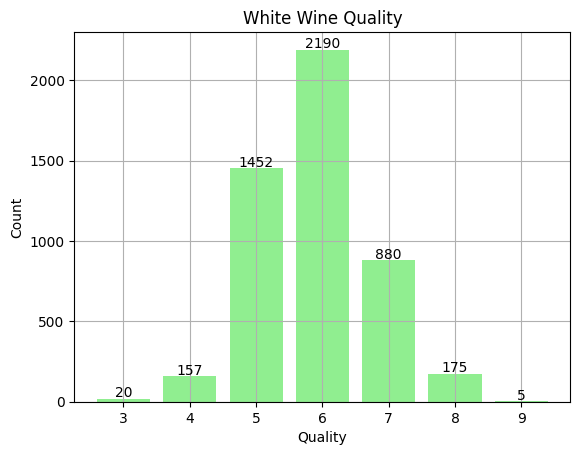

In [6]:
# White Wine
white_counts = white_df['quality'].value_counts()
plt.bar(white_counts.index, white_counts, color='lightgreen')
for i, count in enumerate(white_counts):
    plt.text(white_counts.index[i], count + 10, str(count), ha='center')
plt.title('White Wine Quality')
plt.xlabel('Quality')
plt.ylabel('Count')
plt.xticks(white_counts.index)
plt.grid(True)

plt.show()

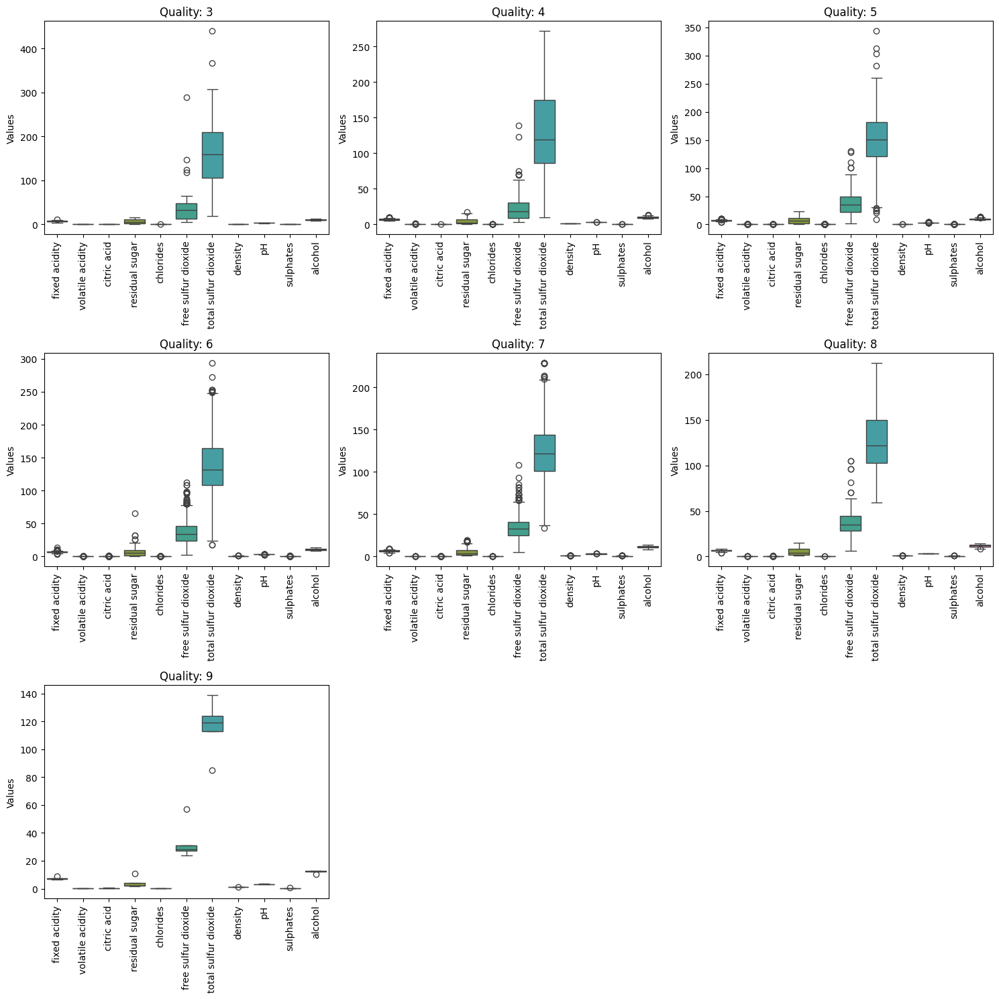

In [7]:
# box plot of the features for each quality

import math

num_quality_levels = len(white_df['quality'].unique())
num_cols = 3
num_rows = math.ceil(num_quality_levels / num_cols)

# Setting up the figure and axes
plt.figure(figsize=(15, 5 * num_rows))

# Creating subplots for each quality level
for i, quality_level in enumerate(sorted(white_df['quality'].unique()), 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(data=white_df[white_df['quality'] == quality_level].drop(columns='quality'), orient='v')
    plt.title(f'Quality: {quality_level}')
    plt.xticks(rotation=90)
    plt.ylabel('Values')

# Adjusting layout
plt.tight_layout()
plt.show()

## Outlier analysis and cleaning

In [8]:
white_df.drop(columns=['type'], inplace=True)

quality_column = 'quality'
feature_columns = white_df.drop(columns=[quality_column]).columns  # Get all feature columns

# Define a function to identify outliers using the IQR method for a given feature column
def identify_outliers(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return data[(data < lower_bound) | (data > upper_bound)]

# Initialize a variable to track if outliers were found
has_outliers = True

# Initialize a variable to track if outliers were found
has_outliers = True

# Initialize a list to store the number of outliers for each iteration
outlier_counts = []

# Loop until no outliers are found
while has_outliers:
    has_outliers = False
    outlier_indices = []  # Using a list to collect indices
    outlier_count = 0  # Initialize outlier count for this iteration
    for feature_column in feature_columns:
        for quality_level in white_df[quality_column].unique():
            data = white_df.loc[white_df[quality_column] == quality_level, feature_column]
            outliers = identify_outliers(data)
            if not outliers.empty:
                has_outliers = True
                outlier_indices.extend(outliers.index)
                outlier_count += len(outliers)

    # Remove only the indices that exist in the DataFrame
    outlier_indices = list(filter(lambda x: x in white_df.index, outlier_indices))

    # Remove outliers and update the DataFrame
    white_df = white_df.drop(outlier_indices)
    # Update feature columns for the next iteration
    feature_columns = white_df.drop(columns=[quality_column]).columns

    # Append the outlier count for this iteration to the list
    outlier_counts.append(outlier_count)

# The loop terminates when no outliers are found in any feature column
# white_df_scaled now contains the DataFrame with no outliers
# outlier_counts contains the number of outliers for each iteration
    
white_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


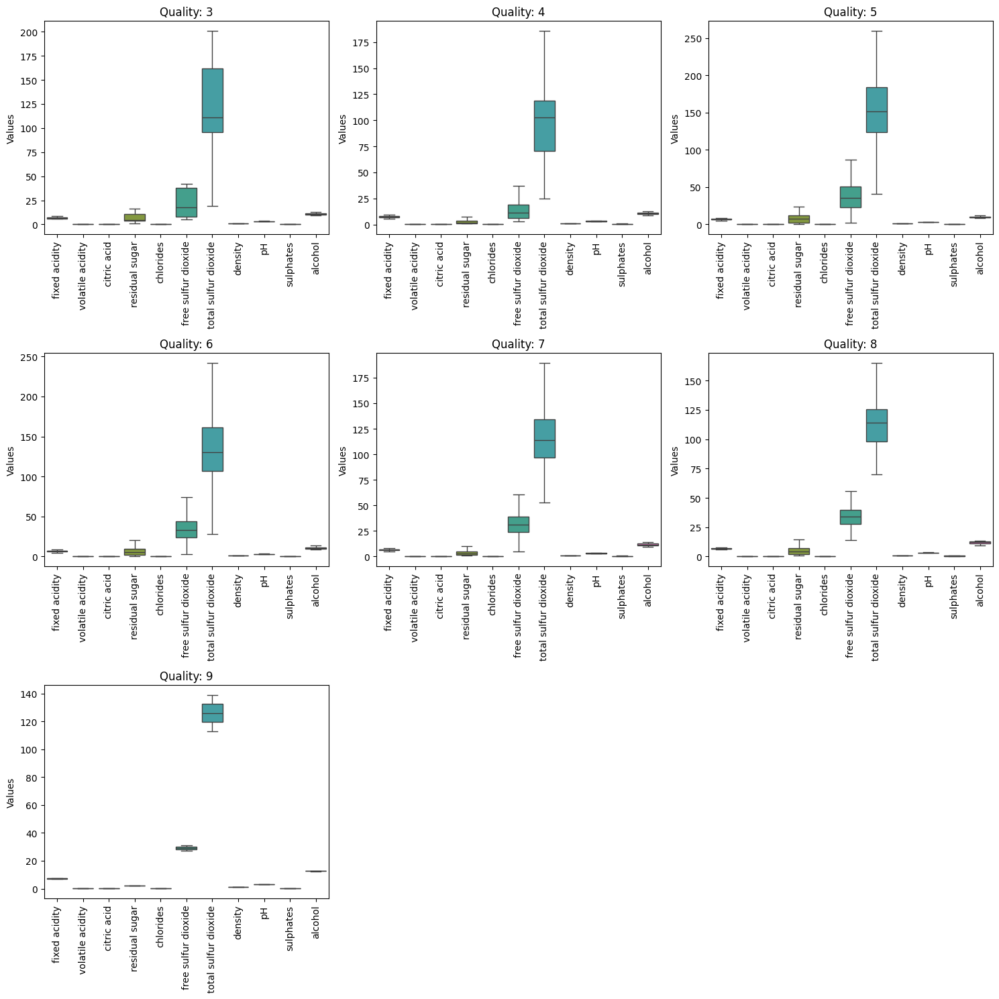

In [9]:
# no outliers

num_quality_levels = len(white_df['quality'].unique())
num_cols = 3
num_rows = math.ceil(num_quality_levels / num_cols)

# Setting up the figure and axes
plt.figure(figsize=(15, 5 * num_rows))

# Creating subplots for each quality level
for i, quality_level in enumerate(sorted(white_df['quality'].unique()), 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(data=white_df[white_df['quality'] == quality_level].drop(columns='quality'), orient='v')
    plt.title(f'Quality: {quality_level}')
    plt.xticks(rotation=90)
    plt.ylabel('Values')

# Adjusting layout
plt.tight_layout()
plt.show()


In [10]:
white_df.index = np.arange(0,len(white_df),1)

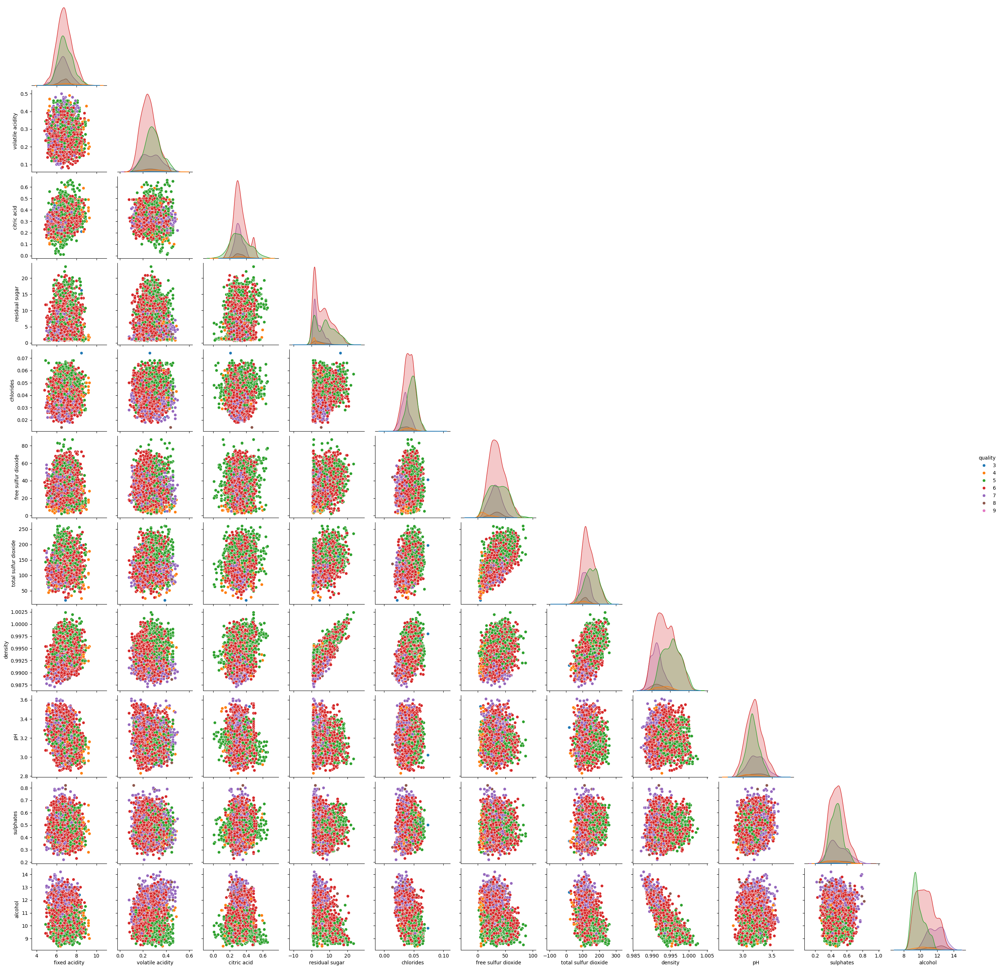

In [11]:
sns.pairplot(white_df, 
             hue='quality', 
             palette="tab10", 
             corner=True)

plt.show()

## The importance of scaling

In [12]:
# standardize the values to have a correct view 
from sklearn.preprocessing import StandardScaler

# This scales each column to have mean=0 and standard deviation=1
SS=StandardScaler()

# Apply scaling
white_df_scaled=pd.DataFrame(SS.fit_transform(white_df.drop(columns=['quality'])), columns=white_df.drop(columns=['quality']).columns)
white_df_scaled['quality'] = white_df['quality']

display(white_df_scaled)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0.276627,0.061736,0.427895,2.994501,0.306772,0.704515,0.834936,2.556208,-1.429169,-0.294937,-1.476173,6
1,-0.681838,0.467173,0.203564,-0.942147,0.731666,-1.374142,-0.098730,0.081645,0.836065,0.128728,-0.896670,6
2,1.782786,0.196882,0.876556,0.150221,0.837889,-0.301287,-0.958685,0.470505,0.534033,-0.400853,-0.399953,6
3,0.550474,-0.478847,-0.020767,0.479993,1.687675,0.838622,1.228058,0.647259,0.005479,-0.824518,-0.565526,6
4,0.550474,-0.478847,-0.020767,0.479993,1.687675,0.838622,1.228058,0.647259,0.005479,-0.824518,-0.565526,6
...,...,...,...,...,...,...,...,...,...,...,...,...
3468,-0.818762,-0.749139,-0.357262,-0.942147,-0.330568,-0.703608,-1.081536,-0.929392,0.609541,0.234644,0.510694,6
3469,-0.271068,0.737465,0.427895,0.376939,0.519219,1.509157,0.785796,0.399803,-0.296552,-0.189021,-0.813884,5
3470,-0.407991,-0.343701,-1.478916,-1.024589,-0.118121,-0.301287,-0.614703,-0.434479,-1.504677,-0.189021,-0.979456,6
3471,-1.777227,0.332027,-0.245097,-1.045200,-2.136364,-0.971822,-0.639273,-1.795489,1.138096,-1.036350,1.835272,7


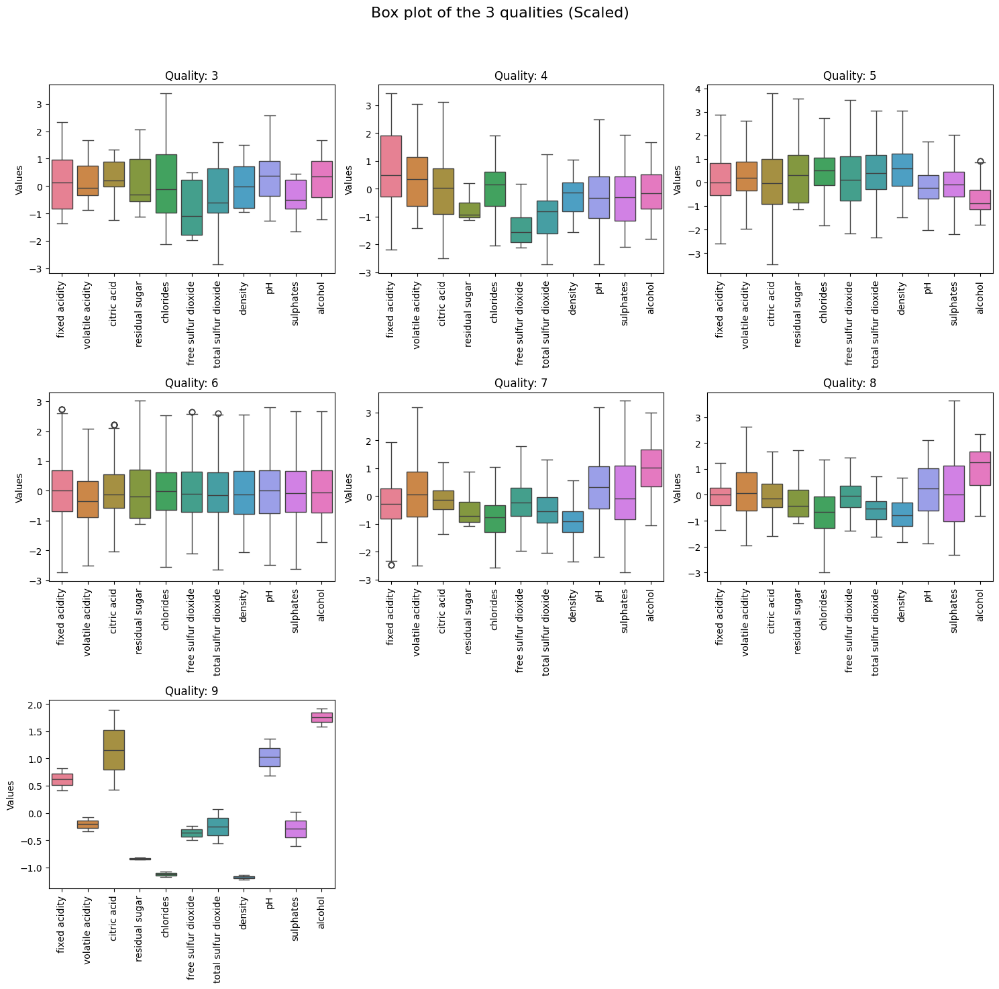

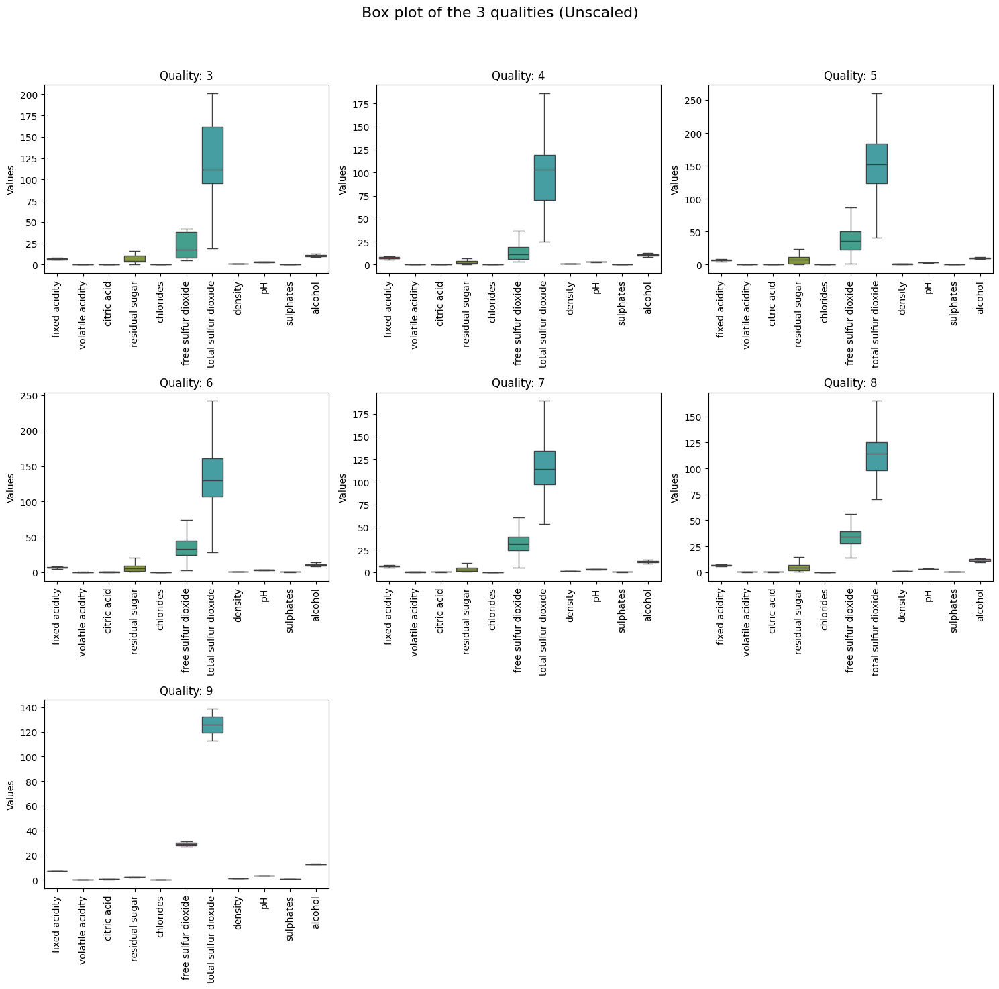

In [13]:
# Number of unique quality levels
num_quality_levels = len(white_df_scaled['quality'].unique())
num_cols = 3
num_rows = math.ceil(num_quality_levels / num_cols)

# Setting up the figure and axes for the scaled data
plt.figure(figsize=(15, 5 * num_rows))

# Adding title for the overall figure
plt.suptitle('Box plot of the 3 qualities (Scaled)', fontsize=16)

# Creating subplots for each quality level for the scaled data
for i, quality_level in enumerate(sorted(white_df_scaled['quality'].unique()), 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(data=white_df_scaled[white_df_scaled['quality'] == quality_level].drop(columns='quality'), orient='v')
    plt.title(f'Quality: {quality_level}')
    plt.xticks(rotation=90)
    plt.ylabel('Values')

# Adjusting layout
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust rect to fit the suptitle
plt.show()

# Setting up the figure and axes for the unscaled data
plt.figure(figsize=(15, 5 * num_rows))

# Adding title for the overall figure
plt.suptitle('Box plot of the 3 qualities (Unscaled)', fontsize=16)

# Creating subplots for each quality level for the unscaled data
for i, quality_level in enumerate(sorted(white_df['quality'].unique()), 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(data=white_df[white_df['quality'] == quality_level].drop(columns='quality'), orient='v')
    plt.title(f'Quality: {quality_level}')
    plt.xticks(rotation=90)
    plt.ylabel('Values')

# Adjusting layout
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust rect to fit the suptitle
plt.show()

In [14]:
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Split X and y
X = white_df.drop('quality', axis=1).values
y = white_df['quality'].values

# Without scaling
pca = PCA(n_components=2).fit(X)
X_transformed = pca.transform(X)

# With scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

scaled_pca = PCA(n_components=2).fit(X_scaled)
X_std_transformed = scaled_pca.transform(X_scaled)

Weights of features in PCA:
                           PC1       PC2  PC1 (scaled)  PC2 (scaled)
fixed acidity         0.001507  0.007547      0.117735      0.621000
volatile acidity      0.000234  0.000957      0.029342      0.036026
citric acid           0.000249  0.000175      0.093977      0.404924
residual sugar        0.048449  0.056428      0.410782      0.000376
chlorides             0.000081  0.000092      0.328172      0.052729
free sulfur dioxide   0.242296  0.967889      0.304973      0.151736
total sulfur dioxide  0.968894  0.244769      0.398325      0.140581
density               0.000037  0.000003      0.497757      0.013292
pH                    0.000098  0.000470      0.097412      0.591717
sulphates             0.000277  0.000793      0.040528      0.218241
alcohol               0.013646  0.006050      0.435249      0.074805


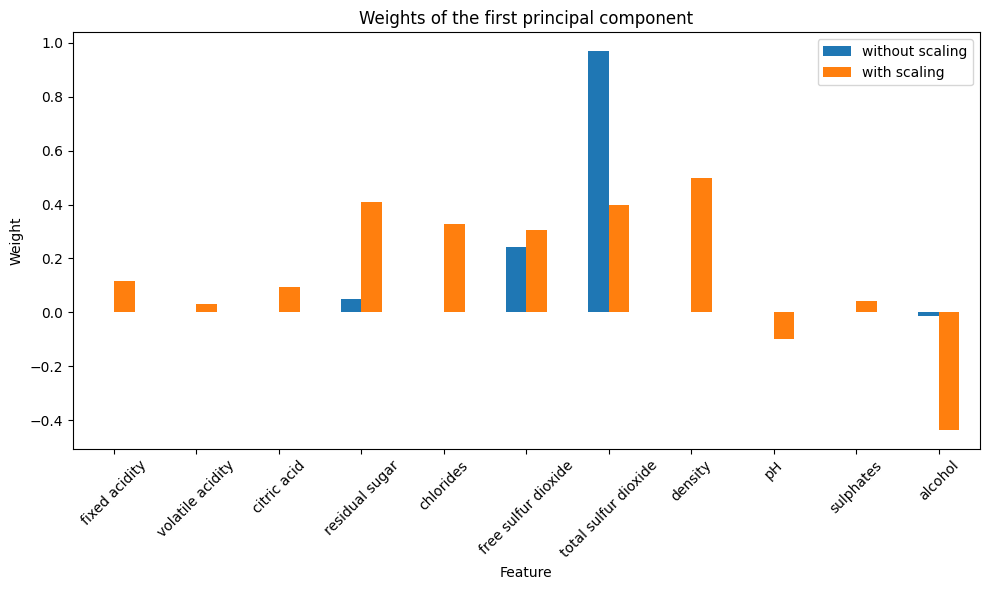

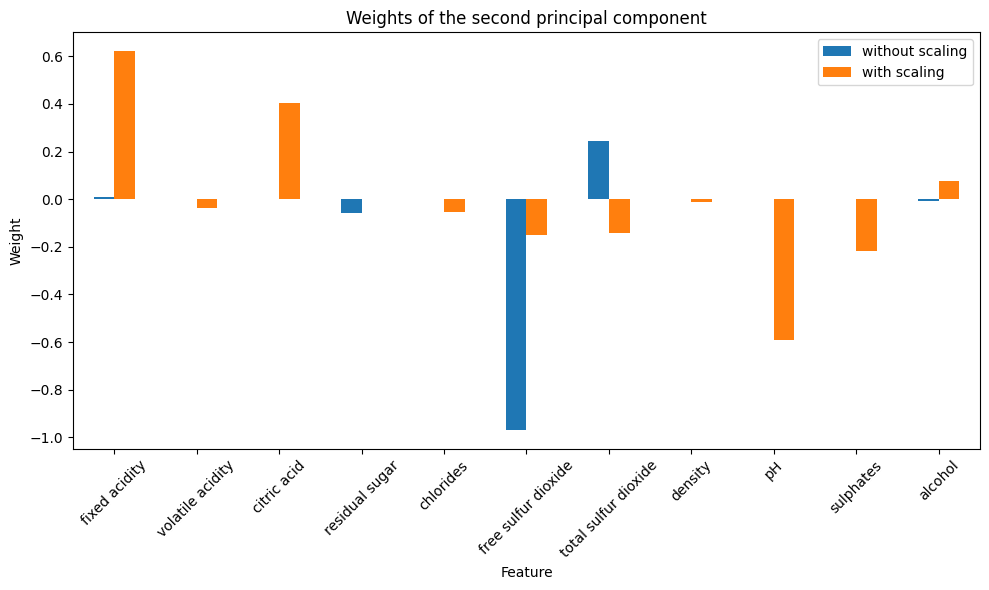

In [15]:
pca_weights = pd.DataFrame(pca.components_.T, columns=[f"PC{i+1}" for i in range(pca.n_components_)], index=white_df.drop('quality', axis=1).columns)
scaled_pca_weights = pd.DataFrame(scaled_pca.components_.T, columns=[f"PC{i+1} (scaled)" for i in range(scaled_pca.n_components_)], index=white_df.drop('quality', axis=1).columns)

pca_weights_abs = pca_weights.abs()
scaled_pca_weights_abs = scaled_pca_weights.abs()

# Concatenate the absolute values of weights
combined_weights = pd.concat([pca_weights_abs, scaled_pca_weights_abs], axis=1)
print("Weights of features in PCA:")
print(combined_weights)

first_pca_component = pd.DataFrame(
    pca.components_[0], index=white_df.drop('quality', axis=1).columns, columns=["without scaling"]
)
first_pca_component["with scaling"] = scaled_pca.components_[0]

second_pca_component = pd.DataFrame(
    pca.components_[1], index=white_df.drop('quality', axis=1).columns, columns=["without scaling"]
)
second_pca_component["with scaling"] = scaled_pca.components_[1]

# Plot bar chart
first_pca_component.plot.bar(
    title="Weights of the first principal component", figsize=(10, 6)
)
plt.xlabel("Feature")
plt.ylabel("Weight")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

second_pca_component.plot.bar(
    title="Weights of the second principal component", figsize=(10, 6)
)
plt.xlabel("Feature")
plt.ylabel("Weight")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

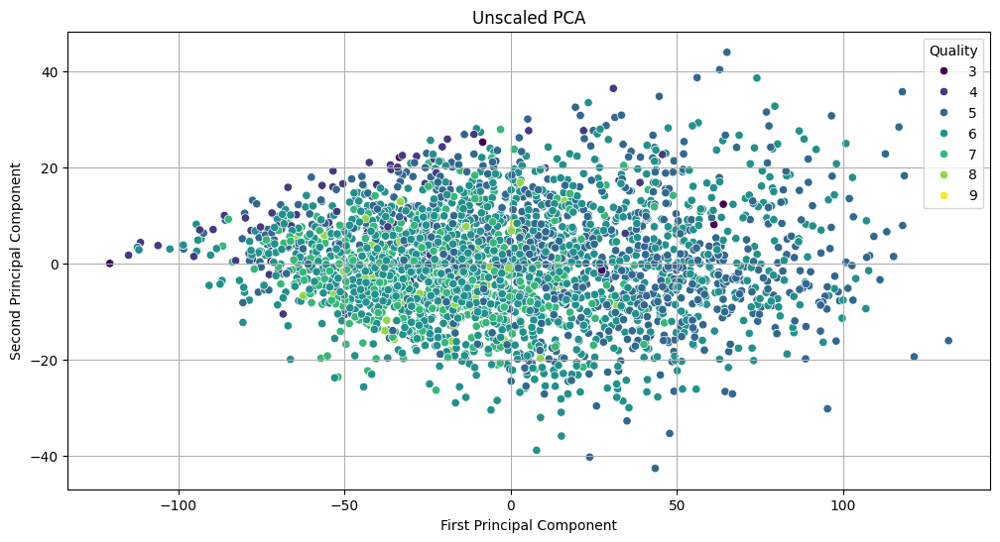

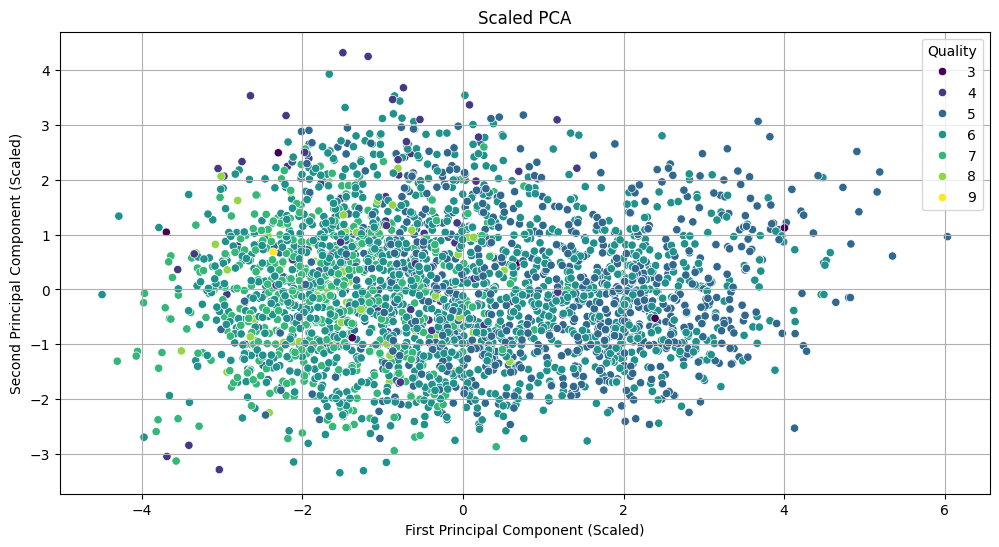

In [16]:
# Scatter plot for unscaled PCA
plt.figure(figsize=(12, 6))
sns.scatterplot(x=X_transformed[:, 0], y=X_transformed[:, 1], hue=y, palette='viridis', legend='full')
plt.title('Unscaled PCA')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.legend(title='Quality')
plt.grid(True)
plt.show()

# Scatter plot for scaled PCA
plt.figure(figsize=(12, 6))
sns.scatterplot(x=X_std_transformed[:, 0], y=X_std_transformed[:, 1], hue=y, palette='viridis', legend='full')
plt.title('Scaled PCA')
plt.xlabel('First Principal Component (Scaled)')
plt.ylabel('Second Principal Component (Scaled)')
plt.legend(title='Quality')
plt.grid(True)
plt.show()

## Dimensionality reduction techniques

### PCA

In [17]:
X = white_df_scaled

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Convert to data frame
principal_df_scaled = pd.DataFrame(data = X_pca, columns = ['PC1', 'PC2'])
principal_df_scaled['quality'] = white_df.quality

# Shape and preview
print(principal_df_scaled.shape)
principal_df_scaled.head()

(3473, 3)


,PC1,PC2,quality
0,3.878249,0.748044,6
1,-0.283704,-0.688462,6
2,0.488140,1.332345,6
3,2.009228,0.029801,6
4,2.009228,0.029801,6


In [18]:
principal_df_scaled.quality.unique()

array([6, 5, 7, 8, 4, 3, 9])

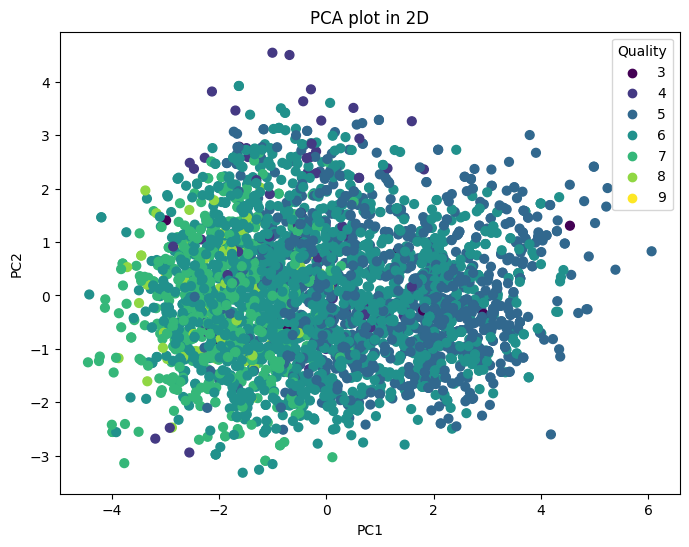

In [19]:
plt.figure(figsize=(8,6))

# Scatterplot
scatter = plt.scatter(principal_df_scaled.iloc[:,0], principal_df_scaled.iloc[:,1], s=40, c=principal_df_scaled['quality'])

# Aesthetics
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2')

unique_quality = np.unique(X.quality)
# Create a scatter plot object with these unique qualities for the legend
for quality in unique_quality:
    plt.scatter([], [], c=[scatter.cmap(scatter.norm(quality))], label=quality)
plt.legend(title='Quality')

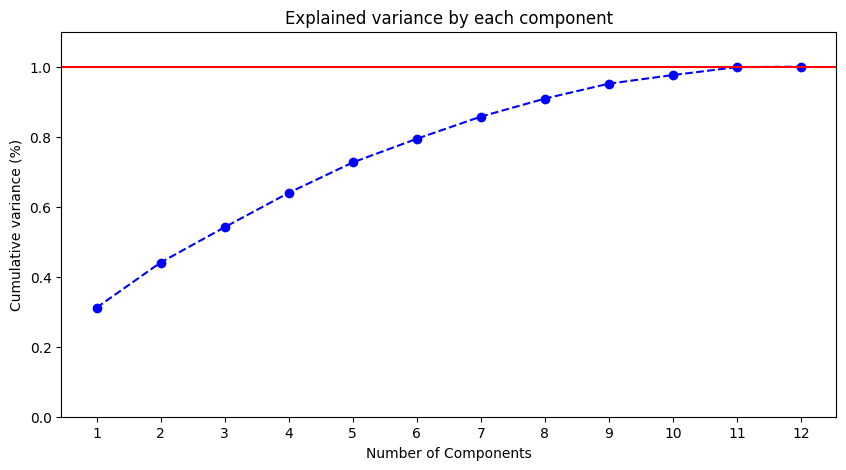

In [20]:
pca_var = PCA()
pca_var.fit(X)

# Plot
plt.figure(figsize=(10,5))
xi = np.arange(1, 1+X.shape[1], step=1)
yi = np.cumsum(pca_var.explained_variance_ratio_)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

# Aesthetics
plt.ylim(0.0,1.1)
plt.xlabel('Number of Components')
plt.xticks(np.arange(1, 1+X.shape[1], step=1))
plt.ylabel('Cumulative variance (%)')
plt.title('Explained variance by each component')
plt.axhline(y=1, color='r', linestyle='-')
plt.gca().xaxis.grid(False)

### T-SNE

In [21]:
from sklearn.manifold import TSNE

# t-SNE
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)

# Convert to data frame
tsne_df = pd.DataFrame(data = X_tsne, columns = ['tsne comp. 1', 'tsne comp. 2'])
tsne_df['quality'] = X.quality

# Shape and preview
print(tsne_df.shape)
tsne_df.head()

(3473, 3)


,tsne comp. 1,tsne comp. 2,quality
0,77.236732,10.564211,6
1,-3.329244,-30.183371,6
2,9.168505,33.895981,6
3,39.078098,17.538488,6
4,39.078136,17.538588,6


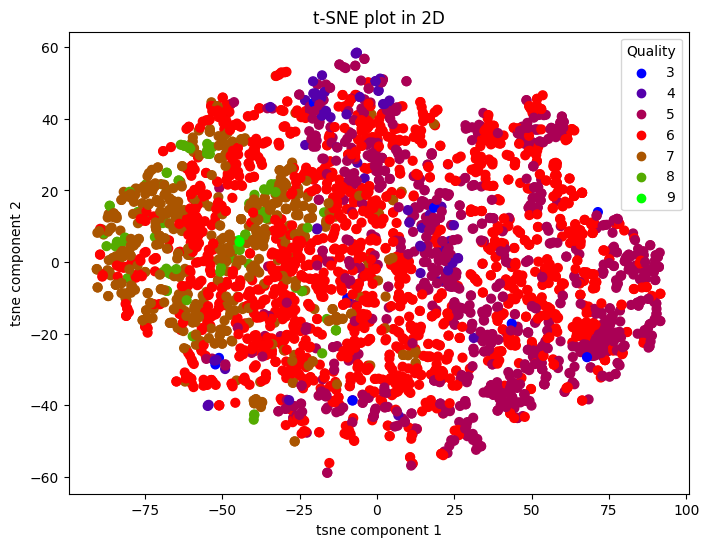

In [22]:
plt.figure(figsize=(8,6))

# Scatterplot
scatter = plt.scatter(tsne_df.iloc[:,0], tsne_df.iloc[:,1], c=X.quality, cmap="brg", s=40)

# Aesthetics
plt.title('t-SNE plot in 2D')
plt.xlabel('tsne component 1')
plt.ylabel('tsne component 2')

unique_quality = np.unique(X.quality)
# Create a scatter plot object with these unique qualities for the legend
for quality in unique_quality:
    plt.scatter([], [], c=[scatter.cmap(scatter.norm(quality))], label=quality)
plt.legend(title='Quality')

# Show plot
plt.show()

### UMAP

In [23]:
import umap

um = umap.UMAP()
X_fit = um.fit(X)           # we'll use X_fit later
X_umap = um.transform(X)

# Convert to data frame
umap_df = pd.DataFrame(data = X_umap, columns = ['umap comp. 1', 'umap comp. 2'])
umap_df['quality'] = X.quality

# Shape and preview
print(umap_df.shape)
umap_df.head()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-05-25 12:52:48.896129: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


(3473, 3)


,umap comp. 1,umap comp. 2,quality
0,0.474649,6.956611,6
1,-0.707074,-0.236189,6
2,1.156414,-1.505332,6
3,0.903672,2.529869,6
4,0.912453,2.504630,6


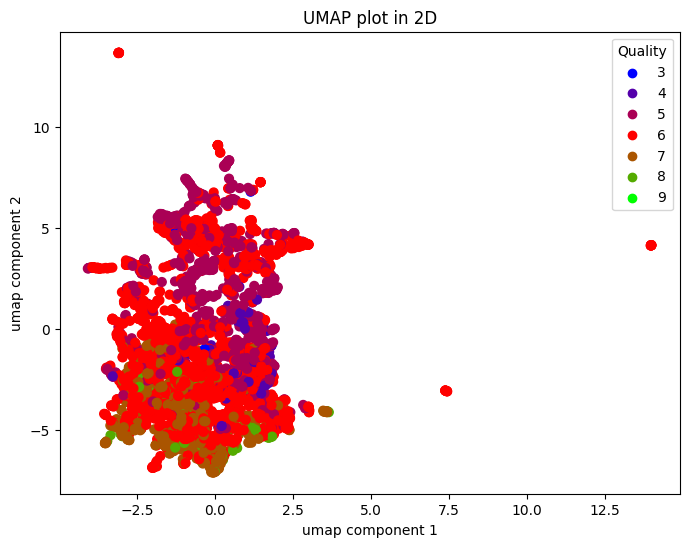

In [24]:
plt.figure(figsize=(8,6))

# Scatterplot
plt.scatter(umap_df.iloc[:,0], umap_df.iloc[:,1], c=X.quality, cmap="brg", s=40)

# Aesthetics
plt.title('UMAP plot in 2D')
plt.xlabel('umap component 1')
plt.ylabel('umap component 2')

unique_quality = np.unique(X.quality)
# Create a scatter plot object with these unique qualities for the legend
for quality in unique_quality:
    plt.scatter([], [], c=[scatter.cmap(scatter.norm(quality))], label=quality)
plt.legend(title='Quality')

# Show plot
plt.show()

As we have seen in the graph above, the class 6 is the one that seems to have characteristics common with the other classes.

## Drop 6th quality

In [25]:
white_df = white_df[white_df['quality'].isin([5, 7, 8, 4, 3, 9])]
white_df.index = np.arange(0, len(white_df), 1)

# Apply scaling
white_df_scaled=pd.DataFrame(SS.fit_transform(white_df.drop(columns=['quality'])), columns=white_df.drop(columns=['quality']).columns)
white_df_scaled['quality'] = white_df['quality']

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,2.518720,-0.679068,0.795027,-0.391386,-0.764073,-1.109234,-0.674164,0.314706,-0.388318,0.567719,-0.649064,5
1,1.537761,-1.327878,0.491681,-1.006470,-0.240995,-1.173771,-1.489501,-0.618963,-0.070649,1.623955,0.199717,5
2,-0.284021,-1.587402,0.795027,-0.944962,0.177468,0.891425,0.141173,-0.895606,2.788373,0.462095,1.434308,7
3,2.098309,1.786410,3.019569,2.694284,-0.240995,0.439663,0.836608,2.216625,-1.658995,2.046449,-0.649064,5
4,-0.284021,-1.457640,0.592796,-0.944962,-1.077920,-0.399323,-0.602222,-0.826445,0.485272,0.778966,0.662689,7
...,...,...,...,...,...,...,...,...,...,...,...,...
1734,-0.844570,1.656648,-1.025052,-0.862951,-2.019460,-1.883682,-1.945130,-1.559549,-1.182491,3.313932,1.897280,7
1735,-0.003747,-0.808830,0.390565,-1.006470,1.014392,0.246051,-0.242515,-0.169419,-1.182491,0.673343,-1.034873,5
1736,-0.424158,-0.679068,0.592796,-0.985967,-1.077920,-0.334785,-0.602222,-0.280076,0.802941,0.673343,-0.649064,5
1737,-0.284021,0.488790,0.390565,0.387720,0.491314,1.472261,0.740686,0.383867,-0.308901,-0.171646,-0.726226,5


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1739 entries, 0 to 1738
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1739 non-null   float64
 1   volatile acidity      1739 non-null   float64
 2   citric acid           1739 non-null   float64
 3   residual sugar        1739 non-null   float64
 4   chlorides             1739 non-null   float64
 5   free sulfur dioxide   1739 non-null   float64
 6   total sulfur dioxide  1739 non-null   float64
 7   density               1739 non-null   float64
 8   pH                    1739 non-null   float64
 9   sulphates             1739 non-null   float64
 10  alcohol               1739 non-null   float64
 11  quality               1739 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 163.2 KB


None

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1.739000e+03,1.739000e+03,1.739000e+03,1.739000e+03,1.739000e+03,1.739000e+03,1.739000e+03,1.739000e+03,1.739000e+03,1.739000e+03,1.739000e+03,1739.000000
mean,-1.274809e-15,-4.085927e-16,2.369838e-16,1.021482e-16,8.580447e-17,1.246208e-16,1.961245e-16,-2.320807e-15,1.119544e-15,-4.903113e-16,8.335291e-16,5.744681
std,1.000288e+00,1.000288e+00,1.000288e+00,1.000288e+00,1.000288e+00,1.000288e+00,1.000288e+00,1.000288e+00,1.000288e+00,1.000288e+00,1.000288e+00,1.121153
min,-2.666352e+00,-2.625498e+00,-3.148478e+00,-1.129487e+00,-2.961001e+00,-2.077294e+00,-2.832408e+00,-2.309942e+00,-2.850254e+00,-2.706611e+00,-1.652169e+00,3.000000
25%,-7.044326e-01,-6.790680e-01,-6.205900e-01,-9.039563e-01,-7.640729e-01,-7.220094e-01,-7.461051e-01,-7.607427e-01,-7.059872e-01,-6.997637e-01,-8.805496e-01,5.000000
50%,-3.747196e-03,-3.025790e-02,-1.150124e-01,-2.478669e-01,-3.176368e-02,-1.209844e-02,-9.863169e-02,-1.140903e-01,-7.064896e-02,-6.602232e-02,-1.089304e-01,5.000000
75%,5.568011e-01,6.185522e-01,4.916808e-01,5.517421e-01,7.005456e-01,6.978125e-01,7.167052e-01,7.089219e-01,6.441066e-01,5.677190e-01,6.626888e-01,7.000000
max,3.499680e+00,2.824506e+00,3.424031e+00,3.565653e+00,3.315936e+00,3.408382e+00,2.946891e+00,2.977392e+00,3.344294e+00,3.630802e+00,2.823223e+00,9.000000


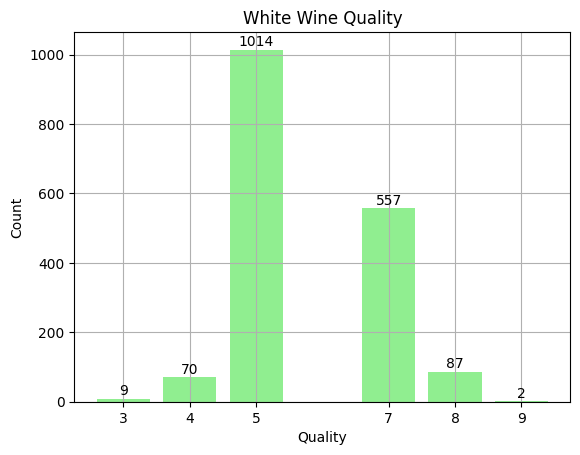

In [26]:
display(white_df_scaled)
display(white_df_scaled.info())
display(white_df_scaled.describe())

white_counts = white_df['quality'].value_counts()
plt.bar(white_counts.index, white_counts, color='lightgreen')
for i, count in enumerate(white_counts):
    plt.text(white_counts.index[i], count + 10, str(count), ha='center')
plt.title('White Wine Quality')
plt.xlabel('Quality')
plt.ylabel('Count')
plt.xticks(white_counts.index)
plt.grid(True)

plt.show()

## Dimensionality reduction tecniques

### PCA

In [27]:
X = white_df_scaled

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Convert to data frame
principal_df_scaled = pd.DataFrame(data = X_pca, columns = ['PC1', 'PC2'])
principal_df_scaled['quality'] = white_df.quality

# Shape and preview
print(principal_df_scaled.shape)
principal_df_scaled.head()

(1739, 3)


,PC1,PC2,quality
0,0.230928,2.518940,5
1,-1.122714,1.992006,5
2,-1.969512,-2.023466,7
3,3.750522,1.353848,5
4,-2.263686,-0.284305,7


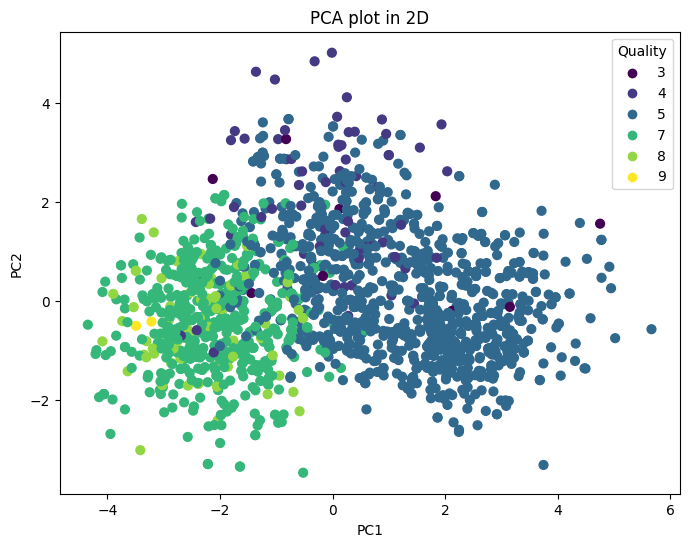

In [28]:
plt.figure(figsize=(8,6))

# Scatterplot
scatter = plt.scatter(principal_df_scaled.iloc[:,0], principal_df_scaled.iloc[:,1], s=40, c=principal_df_scaled['quality'])

# Aesthetics
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2')

unique_quality = np.unique(X.quality)
# Create a scatter plot object with these unique qualities for the legend
for quality in unique_quality:
    plt.scatter([], [], c=[scatter.cmap(scatter.norm(quality))], label=quality)
plt.legend(title='Quality')

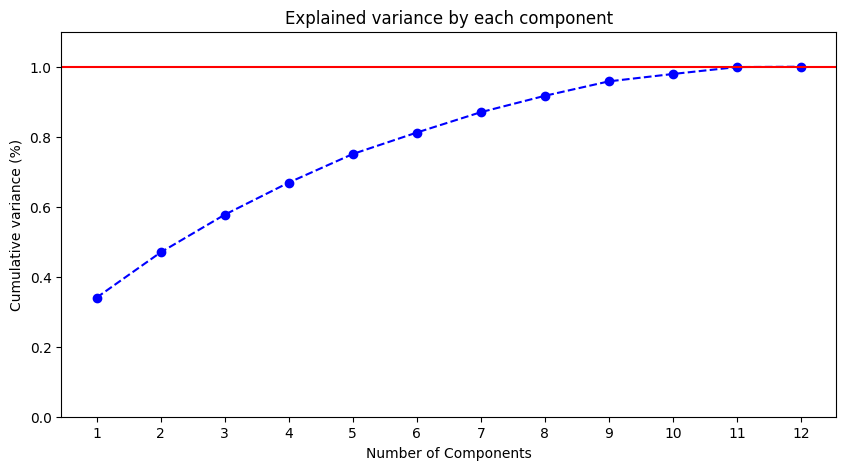

In [29]:
pca_var = PCA()
pca_var.fit(X)

# Plot
plt.figure(figsize=(10,5))
xi = np.arange(1, 1+X.shape[1], step=1)
yi = np.cumsum(pca_var.explained_variance_ratio_)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

# Aesthetics
plt.ylim(0.0,1.1)
plt.xlabel('Number of Components')
plt.xticks(np.arange(1, 1+X.shape[1], step=1))
plt.ylabel('Cumulative variance (%)')
plt.title('Explained variance by each component')
plt.axhline(y=1, color='r', linestyle='-')
plt.gca().xaxis.grid(False)

In [30]:
#3d plot

# PCA
pca = PCA(n_components=3)
components = pca.fit_transform(X)

# 3D scatterplot
fig_pca_2 = px.scatter_3d(
    components, x=0, y=1, z=2, color=principal_df_scaled.quality, size=0.1*np.ones(len(X)), opacity = 1,
    title='PCA plot in 3D',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},
    width=650, height=500
)
fig_pca_2.show()

### TSNE

In [31]:
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)

# Convert to data frame
tsne_df = pd.DataFrame(data = X_tsne, columns = ['tsne comp. 1', 'tsne comp. 2'])
tsne_df['quality'] = X.quality

# Shape and preview
print(tsne_df.shape)
tsne_df.head()

(1739, 3)


,tsne comp. 1,tsne comp. 2,quality
0,-4.900915,36.371822,5
1,-5.615210,34.339802,5
2,-26.872597,-24.611471,7
3,74.853485,16.252588,5
4,-26.355961,-12.570961,7


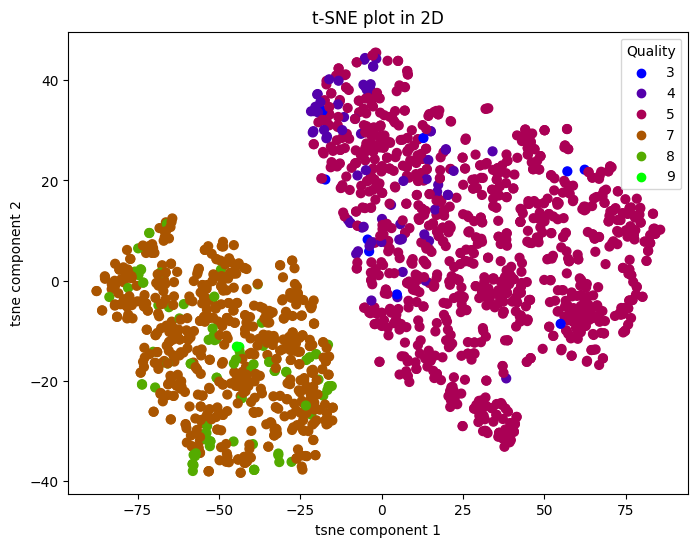

In [32]:
# Figure size
plt.figure(figsize=(8,6))

# Scatterplot
scatter = plt.scatter(tsne_df.iloc[:,0], tsne_df.iloc[:,1], c=X.quality, cmap="brg", s=40)

# Aesthetics
plt.title('t-SNE plot in 2D')
plt.xlabel('tsne component 1')
plt.ylabel('tsne component 2')

unique_quality = np.unique(X.quality)
# Create a scatter plot object with these unique qualities for the legend
for quality in unique_quality:
    plt.scatter([], [], c=[scatter.cmap(scatter.norm(quality))], label=quality)
plt.legend(title='Quality')

# Show plot
plt.show()

In [33]:
# t-SNE
tsne = TSNE(n_components=3)
components_tsne = tsne.fit_transform(X)

# 3D scatterplot
fig_tsne = px.scatter_3d(
    components_tsne, x=0, y=1, z=2, color=X.quality, size=0.1*np.ones(len(X)), opacity = 1,
    title='t-SNE plot in 3D',
    labels={'0': 'comp. 1', '1': 'comp. 2', '2': 'comp. 3'},
    width=650, height=500
)
fig_tsne.show()

### UMAP

In [34]:
um = umap.UMAP()
X_fit = um.fit(X)           
X_umap = um.transform(X)

# Convert to data frame
umap_df = pd.DataFrame(data = X_umap, columns = ['umap comp. 1', 'umap comp. 2'])
umap_df['quality'] = X.quality

# Shape and preview
print(umap_df.shape)
umap_df.head()

(1739, 3)


,umap comp. 1,umap comp. 2,quality
0,0.874514,9.369031,5
1,0.526279,9.341311,5
2,10.821928,1.911401,7
3,-3.012698,1.781040,5
4,11.360595,2.242156,7


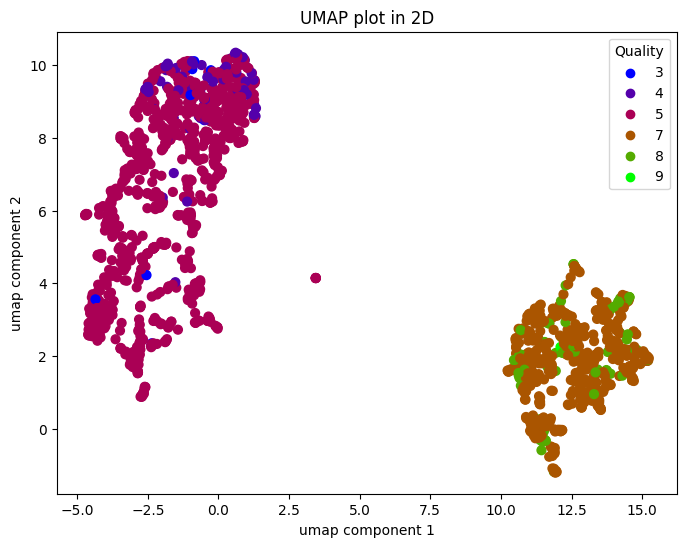

In [35]:
# Figure size
plt.figure(figsize=(8,6))

# Scatterplot
plt.scatter(umap_df.iloc[:,0], umap_df.iloc[:,1], c=X.quality, cmap="brg", s=40)

# Aesthetics
plt.title('UMAP plot in 2D')
plt.xlabel('umap component 1')
plt.ylabel('umap component 2')

unique_quality = np.unique(X.quality)
# Create a scatter plot object with these unique qualities for the legend
for quality in unique_quality:
    plt.scatter([], [], c=[scatter.cmap(scatter.norm(quality))], label=quality)
plt.legend(title='Quality')

# Show plot
plt.show()

In [36]:
um = umap.UMAP(n_components=3)
components_umap = um.fit_transform(X)

# 3D scatterplot
fig_umap = px.scatter_3d(
    components_umap, x=0, y=1, z=2, color=X.quality, size=0.1*np.ones(len(X)), opacity = 1,
    title='UMAP plot in 3D',
    labels={'0': 'comp. 1', '1': 'comp. 2', '2': 'comp. 3'},
    width=650, height=500
)
fig_umap.show()

What it is possible to see after this analysis is that the two main classes (5 and 7) seem to be the more relevant in explaining the characteristics of the 'bad' and 'good' wines respectively. Indeed, it is possible to see that there are two main clusters that clearly appear when visualizing the plots of data after the dimensionality reduction application. We can think about this division as bad wines (qualities 3,4,5) and good wines (qualities 7,8,9).

## 2 classes: Bad ands Good Wine

In [37]:
white_df = white_df[white_df['quality'].isin([5, 7])]
white_df.index = np.arange(0, len(white_df), 1)

# Apply scaling
white_df_scaled=pd.DataFrame(SS.fit_transform(white_df.drop(columns=['quality'])), columns=white_df.drop(columns=['quality']).columns)
white_df_scaled['quality'] = white_df['quality']

In [38]:
data = white_df_scaled

print(f'Missing values in dataset: {data.isna().sum().sum()}')
print('')
print(f'Duplicates in dataset: {data.duplicated().sum()}, ({np.round(100*data.duplicated().sum()/len(data),1)}%)')
print('')
print(f'Data types: {data.dtypes.unique()}')

Missing values in dataset: 0

Duplicates in dataset: 311, (19.8%)

Data types: [dtype('float64') dtype('int64')]


In [39]:
data_without_duplicates = data.drop_duplicates()
data_without_duplicates.index = np.arange(0,len(data_without_duplicates),1)
white_df_scaled = data_without_duplicates

In [40]:
white_df_scaled_2_classes = white_df_scaled
white_df_scaled_2_classes

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,2.606606,-0.684800,0.783393,-0.431161,-0.799604,-1.186403,-0.750507,0.258483,-0.392582,0.565761,-0.597532,5
1,1.602496,-1.339869,0.484629,-1.035465,-0.275541,-1.251559,-1.569650,-0.661928,-0.069340,1.643368,0.258366,5
2,-0.262281,-1.601897,0.783393,-0.975035,0.143709,0.833454,0.068635,-0.934642,2.839839,0.458000,1.503307,7
3,2.176273,1.804464,2.974334,2.600430,-0.275541,0.377357,0.767315,2.133394,-1.685550,2.074411,-0.597532,5
4,-0.262281,-1.470883,0.584217,-0.975035,-1.114041,-0.469680,-0.678230,-0.866464,0.496334,0.781283,0.725219,7
...,...,...,...,...,...,...,...,...,...,...,...,...
1255,-0.836059,1.673450,-1.009194,-0.894461,-2.057354,-1.968283,-2.027406,-1.589156,-1.200687,3.367540,1.970160,7
1256,0.024607,-0.815814,0.385041,-1.035465,0.982208,0.181887,-0.316844,-0.218767,-1.200687,0.673522,-0.986576,5
1257,-0.405726,-0.684800,0.584217,-1.015322,-1.114041,-0.404523,-0.678230,-0.327853,0.819576,0.673522,-0.597532,5
1258,-0.262281,0.494325,0.385041,0.334290,0.458146,1.419863,0.670946,0.326662,-0.311771,-0.188564,-0.675341,5


In [41]:
X = white_df_scaled_2_classes
# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Convert to data frame
principal_df = pd.DataFrame(data = X_pca, columns = ['PC1', 'PC2'])
principal_df['quality'] = white_df_scaled_2_classes.quality

# Shape and preview
print(principal_df.shape)
principal_df.head()

(1260, 3)


,PC1,PC2,quality
0,0.149081,2.756499,5
1,-1.229050,2.041317,5
2,-1.954292,-1.671130,7
3,3.766936,2.527936,5
4,-2.271007,0.067424,7


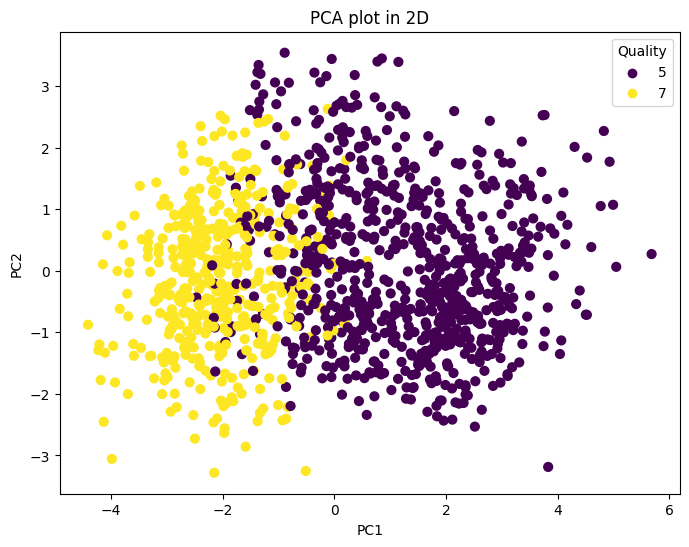

In [42]:
plt.figure(figsize=(8,6))

# Scatterplot
scatter = plt.scatter(principal_df.iloc[:,0], principal_df.iloc[:,1], s=40, c=principal_df['quality'])

# Aesthetics
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2')

unique_quality = np.unique(X.quality)
# Create a scatter plot object with these unique qualities for the legend
for quality in unique_quality:
    plt.scatter([], [], c=[scatter.cmap(scatter.norm(quality))], label=quality)
plt.legend(title='Quality')

In [43]:
#3d plot

# PCA
pca = PCA(n_components=3)
components = pca.fit_transform(X)

# 3D scatterplot
fig_pca_2 = px.scatter_3d(
    components, x=0, y=1, z=2, color=X.quality, size=0.1*np.ones(len(X)), opacity = 1,
    title='PCA plot in 3D',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},
    width=650, height=500
)
fig_pca_2.show()

In [44]:
# t-SNE
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)

# Convert to data frame
tsne_df = pd.DataFrame(data = X_tsne, columns = ['tsne comp. 1', 'tsne comp. 2'])
tsne_df['quality'] = X.quality

# Shape and preview
print(tsne_df.shape)
tsne_df.head()

(1260, 3)


,tsne comp. 1,tsne comp. 2,quality
0,-5.729777,5.604287,5
1,-7.069867,4.988105,5
2,-39.717411,16.061073,7
3,61.561401,9.954668,5
4,-34.968895,4.597440,7


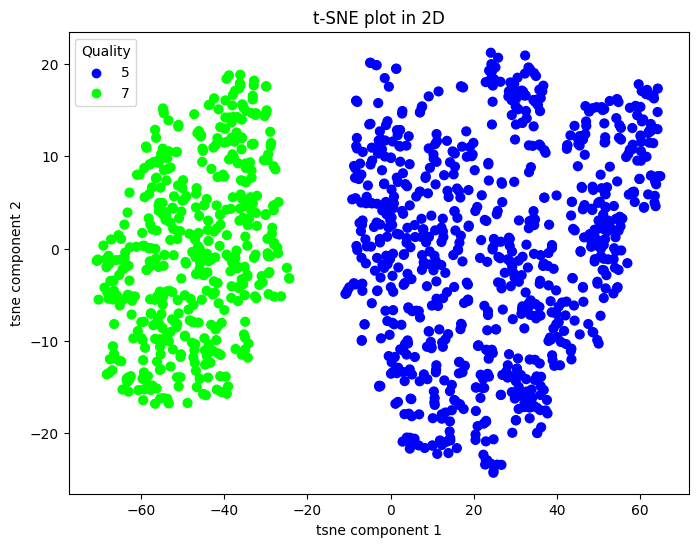

In [45]:
# Figure size
plt.figure(figsize=(8,6))

# Scatterplot
scatter = plt.scatter(tsne_df.iloc[:,0], tsne_df.iloc[:,1], c=X.quality, cmap="brg", s=40)

# Aesthetics
plt.title('t-SNE plot in 2D')
plt.xlabel('tsne component 1')
plt.ylabel('tsne component 2')

unique_quality = np.unique(X.quality)
# Create a scatter plot object with these unique qualities for the legend
for quality in unique_quality:
    plt.scatter([], [], c=[scatter.cmap(scatter.norm(quality))], label=quality)
plt.legend(title='Quality')

# Show plot
plt.show()

In [46]:
# t-SNE
tsne = TSNE(n_components=3)
components_tsne = tsne.fit_transform(X)

# 3D scatterplot
fig_tsne = px.scatter_3d(
    components_tsne, x=0, y=1, z=2, color=X.quality, size=0.1*np.ones(len(X)), opacity = 1,
    title='t-SNE plot in 3D',
    labels={'0': 'comp. 1', '1': 'comp. 2', '2': 'comp. 3'},
    width=650, height=500
)
fig_tsne.show()

In [47]:
um = umap.UMAP()
X_fit = um.fit(X)           # we'll use X_fit later
X_umap = um.transform(X)

# Convert to data frame
umap_df = pd.DataFrame(data = X_umap, columns = ['umap comp. 1', 'umap comp. 2'])
umap_df['quality'] = X.quality

# Shape and preview
print(umap_df.shape)
umap_df.head()

(1260, 3)


,umap comp. 1,umap comp. 2,quality
0,9.441915,-0.020537,5
1,9.662952,-0.145014,5
2,-2.434886,3.904902,7
3,10.238028,5.507444,5
4,-3.384766,4.494824,7


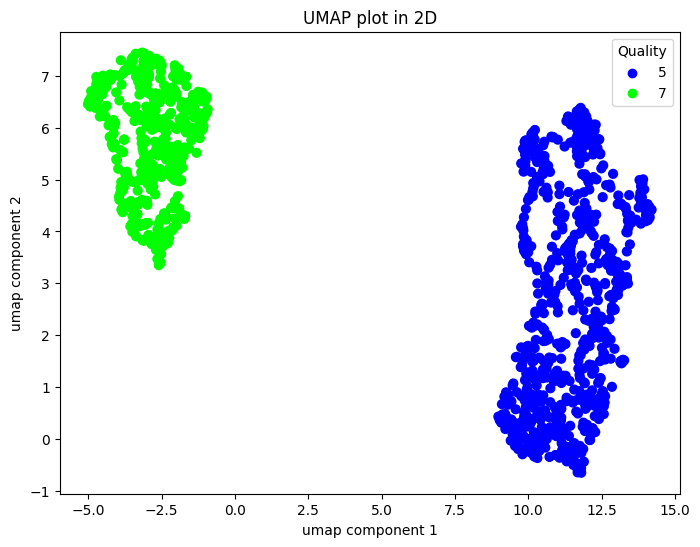

In [48]:
# Figure size
plt.figure(figsize=(8,6))

# Scatterplot
plt.scatter(umap_df.iloc[:,0], umap_df.iloc[:,1], c=X.quality, cmap="brg", s=40)

# Aesthetics
plt.title('UMAP plot in 2D')
plt.xlabel('umap component 1')
plt.ylabel('umap component 2')

unique_quality = np.unique(X.quality)
# Create a scatter plot object with these unique qualities for the legend
for quality in unique_quality:
    plt.scatter([], [], c=[scatter.cmap(scatter.norm(quality))], label=quality)
plt.legend(title='Quality')

# Show plot
plt.show()

In [49]:
um = umap.UMAP(n_components=3)
components_umap = um.fit_transform(X)

# 3D scatterplot
fig_umap = px.scatter_3d(
    components_umap, x=0, y=1, z=2, color=X.quality, size=0.1*np.ones(len(X)), opacity = 1,
    title='UMAP plot in 3D',
    labels={'0': 'comp. 1', '1': 'comp. 2', '2': 'comp. 3'},
    width=650, height=500
)
fig_umap.show()

## Clustering models

In this section I will use some clustering models to predict the quality of wines (bad and good).

In [50]:
# splitting in train and test data

X_scaled = white_df_scaled_2_classes

scaled_pca = PCA(n_components=3).fit(X_scaled)
X_std_transformed_pca_scaled = scaled_pca.transform(X_scaled)

df_pca_scaled = pd.DataFrame({
    'PC1 (scaled)': X_std_transformed_pca_scaled[:, 0],
    'PC2 (scaled)': X_std_transformed_pca_scaled[:, 1],
    'PC3 (scaled)': X_std_transformed_pca_scaled[:, 2],
    'Quality': X_scaled['quality']
})
df_pca_scaled.columns=['Component 1 (PCA)', 'Component 2 (PCA))', 'Component 3 (PCA)', 'Quality']
df_pca_scaled.drop(columns=['Component 3 (PCA)'], inplace=True)
df_pca_scaled = df_pca_scaled.reindex()

display(df_pca_scaled)

,Component 1 (PCA),Component 2 (PCA)),Quality
0,0.149081,2.756499,5
1,-1.229050,2.041317,5
2,-1.954292,-1.671130,7
3,3.766936,2.527936,5
4,-2.271007,0.067424,7
...,...,...,...
1255,-4.067983,0.574758,7
1256,0.744501,0.809415,5
1257,-0.758658,-0.170105,5
1258,1.765585,-0.517182,5


In [51]:
from sklearn.model_selection import train_test_split

X_train_pca_scaled, X_test_pca_scaled, y_train_pca_scaled, y_test_pca_scaled = train_test_split(
    df_pca_scaled, df_pca_scaled['Quality'], test_size=0.30, random_state=42)

X_train_pca_scaled.drop(columns=['Quality'], inplace=True)
X_test_pca_scaled.drop(columns=['Quality'], inplace=True)

y_pca_scaled = df_pca_scaled['Quality']

In [52]:
X_train_pca_scaled.columns = X_train_pca_scaled.columns.astype(str)

X_train_scaled = X_train_pca_scaled.values
X_test_scaled = X_test_pca_scaled.values

### KNN

The optimal number of neighbors is: 23


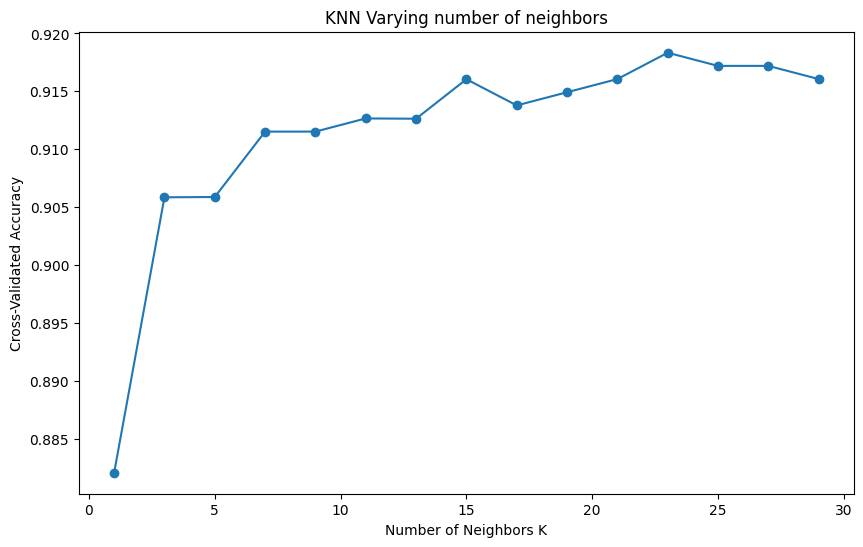

In [89]:
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

#selecting the best value for k
# Define a range of k values to test
k_values = range(1, 31, 2)
# List to store cross-validation scores
cv_scores = []

# Perform 10-fold cross-validation for each k
for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train_scaled, y_train_pca_scaled, cv=10, scoring='accuracy')
    cv_scores.append(scores.mean())

# Find the value of k with the highest score
optimal_k = k_values[np.argmax(cv_scores)]
print("The optimal number of neighbors is:", optimal_k)

# Plot the cross-validation scores
plt.figure(figsize=(10, 6))
plt.plot(k_values, cv_scores, marker='o')
plt.xlabel('Number of Neighbors K')
plt.ylabel('Cross-Validated Accuracy')
plt.title('KNN Varying number of neighbors')
plt.show()

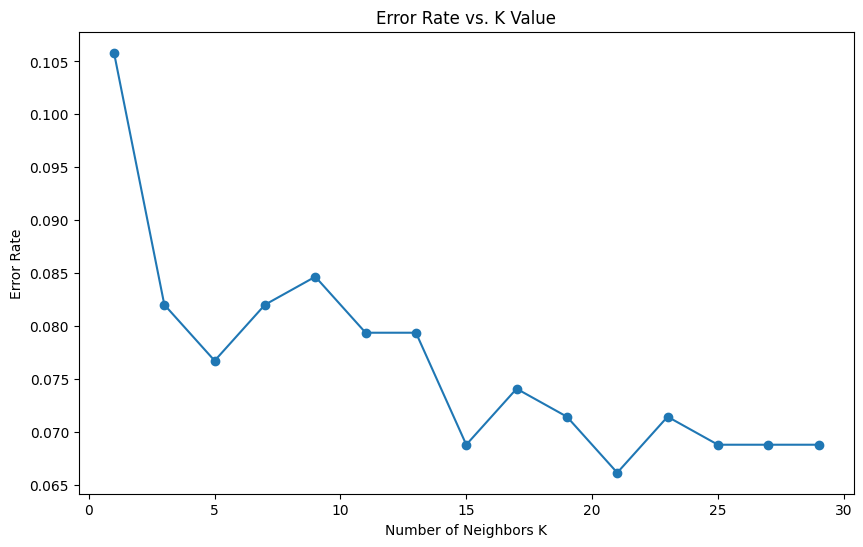

In [54]:
# Calculate error rate for each k
error_rates = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_scaled, y_train_pca_scaled)
    pred_k = knn.predict(X_test_scaled)
    error_rates.append(np.mean(pred_k != y_test_pca_scaled))

# Plot the error rate vs. k
plt.figure(figsize=(10, 6))
plt.plot(k_values, error_rates, marker='o')
plt.xlabel('Number of Neighbors K')
plt.ylabel('Error Rate')
plt.title('Error Rate vs. K Value')
plt.show()

In [55]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {'n_neighbors': k_values}

# Instantiate GridSearchCV with 10-fold cross-validation
grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=10, scoring='accuracy')

# Fit the model
grid_search.fit(X_train_scaled, y_train_pca_scaled)

# Get the best parameter and the best score
best_k = grid_search.best_params_['n_neighbors']
best_score = grid_search.best_score_

print("Best number of neighbors: ", best_k)
print("Best cross-validated accuracy: ", best_score)

Best number of neighbors:  23
Best cross-validated accuracy:  0.918335035750766


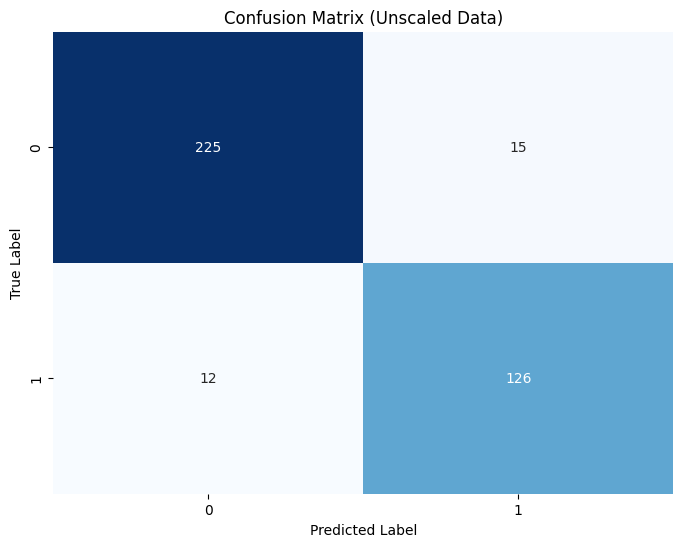

Classification Report (Unscaled Data):
               precision    recall  f1-score   support

           5       0.95      0.94      0.94       240
           7       0.89      0.91      0.90       138

    accuracy                           0.93       378
   macro avg       0.92      0.93      0.92       378
weighted avg       0.93      0.93      0.93       378



In [56]:
from sklearn.metrics import confusion_matrix, classification_report

clf = KNeighborsClassifier(n_neighbors=best_k)
# Fit the model to the scaled data
clf.fit(X_train_scaled, y_train_pca_scaled)
y_pred_scaled = clf.predict(X_test_scaled)

# Confusion matrix for scaled data
conf_matrix_scaled= confusion_matrix(y_test_pca_scaled, y_pred_scaled)

# Classification report for scaled data
class_report_scaled_knn = classification_report(y_test_pca_scaled, y_pred_scaled)

# Visualize confusion matrix for scaled data
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_scaled, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix (Unscaled Data)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

print("Classification Report (Unscaled Data):\n", class_report_scaled_knn)

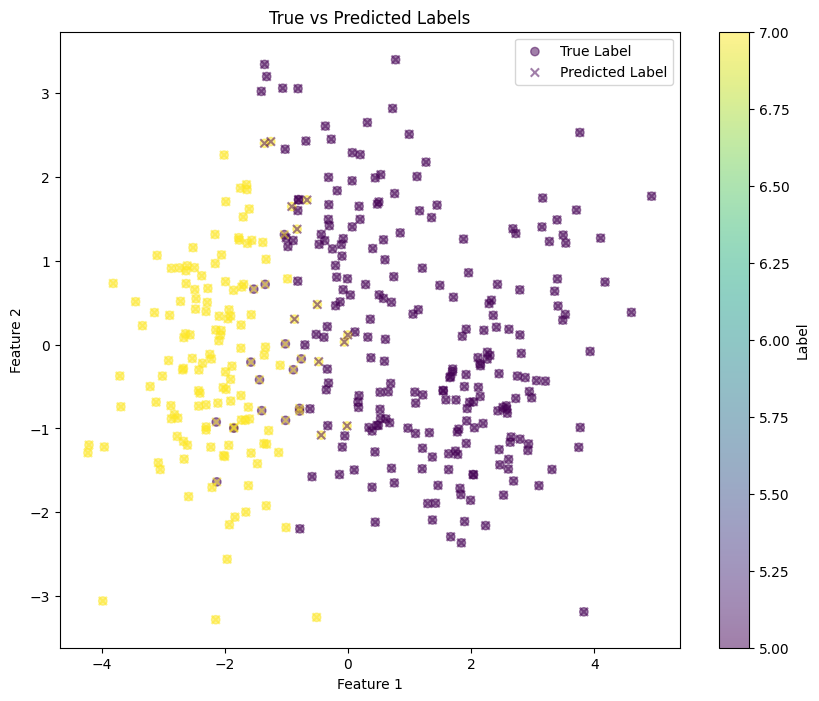

In [57]:
# Plot the data points with true labels
plt.figure(figsize=(10, 8))
plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', label='True Label', alpha=0.5)

# Overlay the predicted labels
plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_pred_scaled, cmap='viridis', marker='x', label='Predicted Label', alpha=0.5)

plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.title("True vs Predicted Labels")
plt.legend()
plt.colorbar(label='Label')
plt.show()

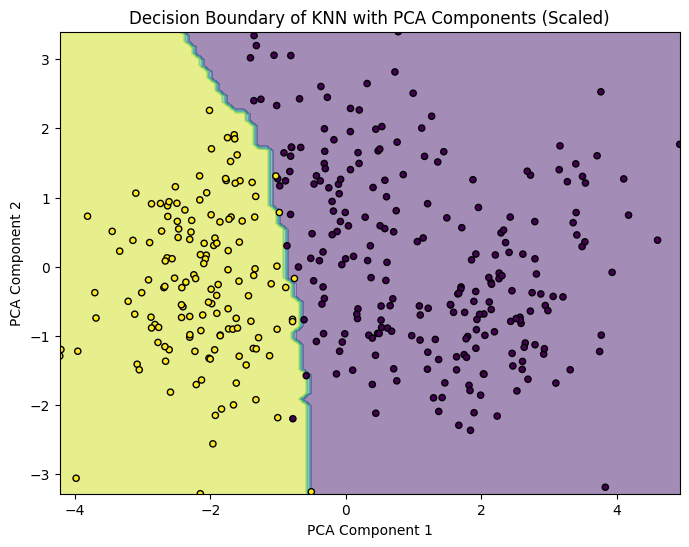

In [58]:
X_pca_plot_test_scaled = X_test_scaled[:, :2]

# Fit and plot model function
def fit_and_plot_model(X_pca_plot_test, y_pred, clf, ax):
    clf.fit(X_pca_plot_test, y_pred)
    disp = DecisionBoundaryDisplay.from_estimator(
        clf,
        X_pca_plot_test,
        response_method="predict",
        alpha=0.5,
        ax=ax,
    )
    ax.scatter(X_pca_plot_test[:, 0], X_pca_plot_test[:, 1], c=y_pred, s=20, edgecolor="k")
    ax.set_xlim((X_pca_plot_test[:, 0].min(), X_pca_plot_test[:, 0].max()))
    ax.set_ylim((X_pca_plot_test[:, 1].min(), X_pca_plot_test[:, 1].max()))
    return disp.ax_

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Call the function to fit and plot the model with unscaled PCA
fit_and_plot_model(X_pca_plot_test_scaled, y_pred_scaled, clf, ax)

# Set labels and title
ax.set_xlabel("PCA Component 1")
ax.set_ylabel("PCA Component 2")
ax.set_title("Decision Boundary of KNN with PCA Components (Scaled)")

# Show the plot
plt.show()

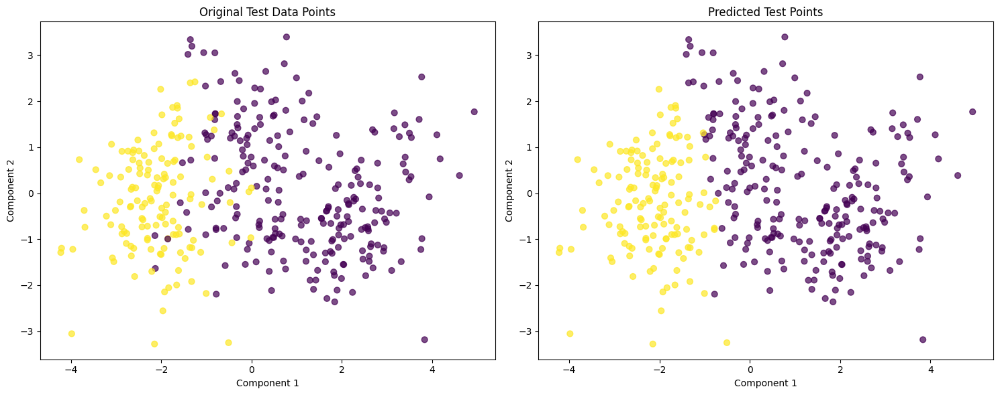

In [59]:
X_test_first_two_scaled = X_test_pca_scaled.iloc[:, :2].values

# Create the figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot the original test data points
axes[0].scatter(X_test_first_two_scaled[:, 0], X_test_first_two_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', s=40, alpha=0.7)
axes[0].set_title('Original Test Data Points')
axes[0].set_xlabel('Component 1')
axes[0].set_ylabel('Component 2')

# Plot the predicted test points
axes[1].scatter(X_test_first_two_scaled[:, 0], X_test_first_two_scaled[:, 1], c=y_pred_scaled, cmap='viridis', s=40, alpha=0.7)
axes[1].set_title('Predicted Test Points')
axes[1].set_xlabel('Component 1')
axes[1].set_ylabel('Component 2')

# Adjust layout
plt.tight_layout()
plt.show()

#### changing the values of k

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



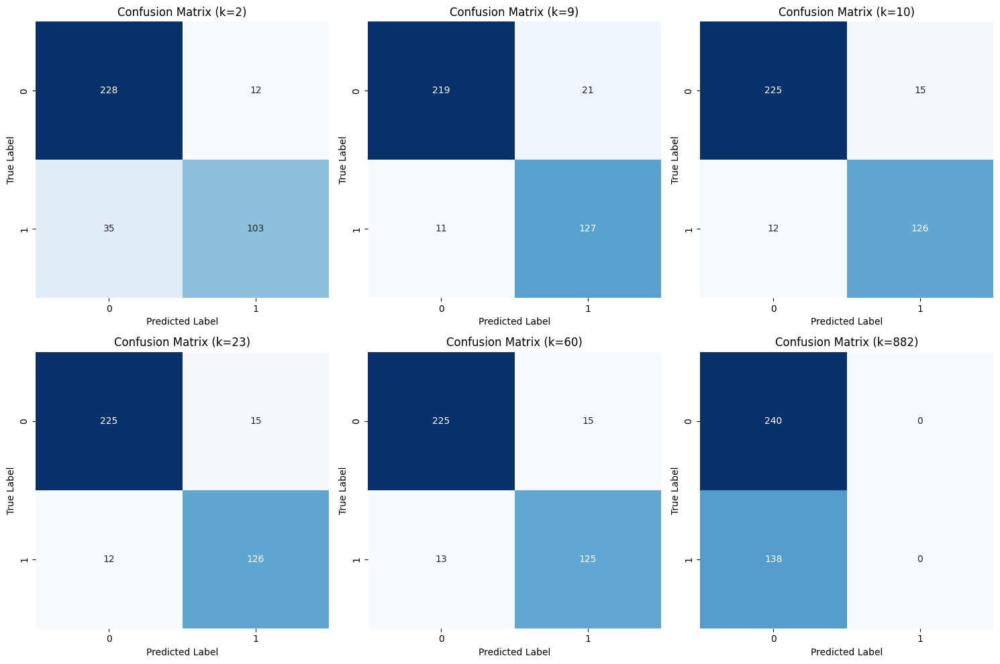

In [60]:
# List of k values to test
k_values = [2, 9, 10, best_k, 60, len(X_train_scaled)]

# Initialize a list to store the confusion matrices
conf_matrices = []
class_reports = []

for k in k_values:
    clf = KNeighborsClassifier(n_neighbors=k)
    clf.fit(X_train_scaled, y_train_pca_scaled)
    y_pred_scaled = clf.predict(X_test_scaled)
    
    # Compute the confusion matrix
    conf_matrix = confusion_matrix(y_test_pca_scaled, y_pred_scaled)
    conf_matrices.append((k, conf_matrix))
    
    # Compute the classification report
    class_report = classification_report(y_test_pca_scaled, y_pred_scaled, output_dict=True)
    class_reports.append((k, class_report))

# Plot the confusion matrices
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes = axes.ravel()

for idx, (k, conf_matrix) in enumerate(conf_matrices):
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[idx])
    axes[idx].set_title(f"Confusion Matrix (k={k})")
    axes[idx].set_xlabel("Predicted Label")
    axes[idx].set_ylabel("True Label")

plt.tight_layout()
plt.show()


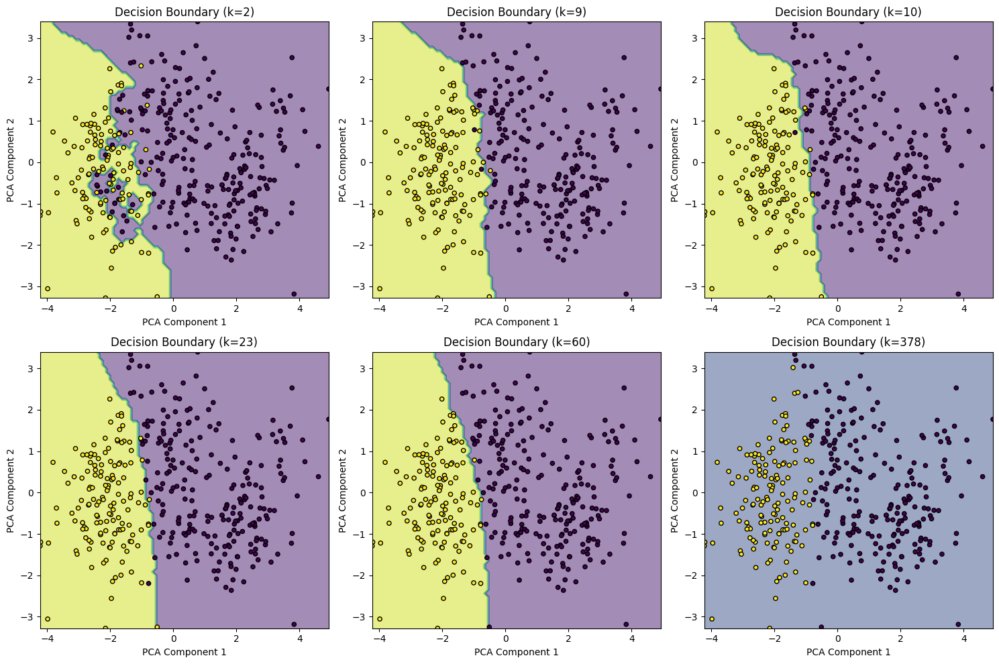

In [61]:
# List of k values to test
k_values = [2, 9, 10, best_k, 60, len(X_test_scaled)]

# Initialize lists to store confusion matrices and classification reports
conf_matrices = []
class_reports = []

# Fit the model, predict and store the results for each k
for k in k_values:
    clf = KNeighborsClassifier(n_neighbors=k)
    clf.fit(X_train_scaled, y_train_pca_scaled)
    y_pred_scaled = clf.predict(X_test_scaled)
    
    # Compute and store the confusion matrix
    conf_matrix = confusion_matrix(y_test_pca_scaled, y_pred_scaled)
    conf_matrices.append((k, conf_matrix))
    
    # Compute and store the classification report
    class_report = classification_report(y_test_pca_scaled, y_pred_scaled, output_dict=True)
    class_reports.append((k, class_report))

# Prepare data for plotting decision boundaries
X_pca_plot_test_scaled = X_test_scaled[:, :2]

# Define a function to fit and plot the model
def fit_and_plot_model(X_pca_plot_test, y_pred, clf, ax):
    clf.fit(X_pca_plot_test, y_pred)
    disp = DecisionBoundaryDisplay.from_estimator(
        clf,
        X_pca_plot_test,
        response_method="predict",
        alpha=0.5,
        ax=ax,
    )
    ax.scatter(X_pca_plot_test[:, 0], X_pca_plot_test[:, 1], c=y_pred, s=20, edgecolor="k")
    ax.set_xlim((X_pca_plot_test[:, 0].min(), X_pca_plot_test[:, 0].max()))
    ax.set_ylim((X_pca_plot_test[:, 1].min(), X_pca_plot_test[:, 1].max()))
    return disp.ax_

# Create subplots for decision boundaries
fig, axes = plt.subplots(2, 3, figsize=(15,10))
axes = axes.ravel()

for idx, k in enumerate(k_values):
    clf = KNeighborsClassifier(n_neighbors=k)
    clf.fit(X_train_scaled, y_train_pca_scaled)
    y_pred_scaled = clf.predict(X_test_scaled)
    fit_and_plot_model(X_pca_plot_test_scaled, y_pred_scaled, clf, axes[idx])
    axes[idx].set_xlabel("PCA Component 1")
    axes[idx].set_ylabel("PCA Component 2")
    axes[idx].set_title(f"Decision Boundary (k={k})")

plt.tight_layout()
plt.show()


### SVM

In [62]:
from sklearn.svm import SVC

#### linear kernel

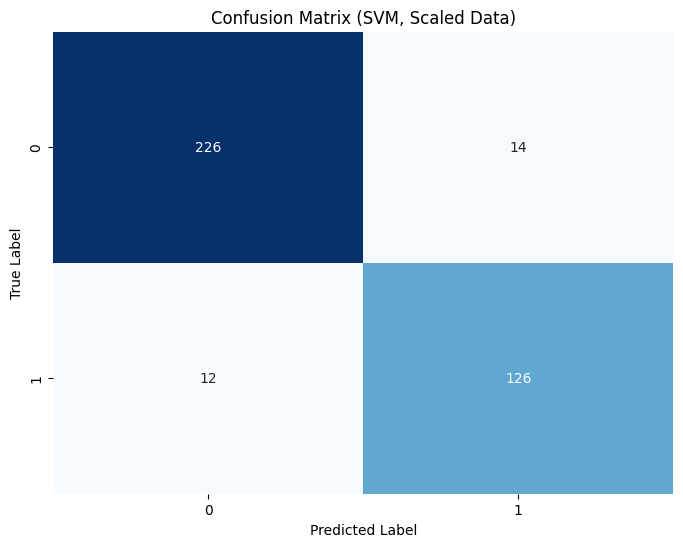

Classification Report (SVM, Scaled Data):
               precision    recall  f1-score   support

           5       0.95      0.94      0.95       240
           7       0.90      0.91      0.91       138

    accuracy                           0.93       378
   macro avg       0.92      0.93      0.93       378
weighted avg       0.93      0.93      0.93       378



In [91]:
# Create an SVM classifier
clf_svm = SVC(kernel='linear')

# Fit the SVM model to the unscaled data
clf_svm.fit(X_train_scaled, y_train_pca_scaled)

# Predict the labels for the test data
y_pred_svm_scaled_linear = clf_svm.predict(X_test_scaled)

# Confusion matrix for unscaled data
conf_matrix_svm_scaled = confusion_matrix(y_test_pca_scaled, y_pred_svm_scaled_linear)

# Classification report for unscaled data
class_report_svm_scaled = classification_report(y_test_pca_scaled, y_pred_svm_scaled_linear)

# Visualize confusion matrix for unscaled data
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_svm_scaled, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix (SVM, Scaled Data)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Print classification report
print("Classification Report (SVM, Scaled Data):\n", class_report_svm_scaled)

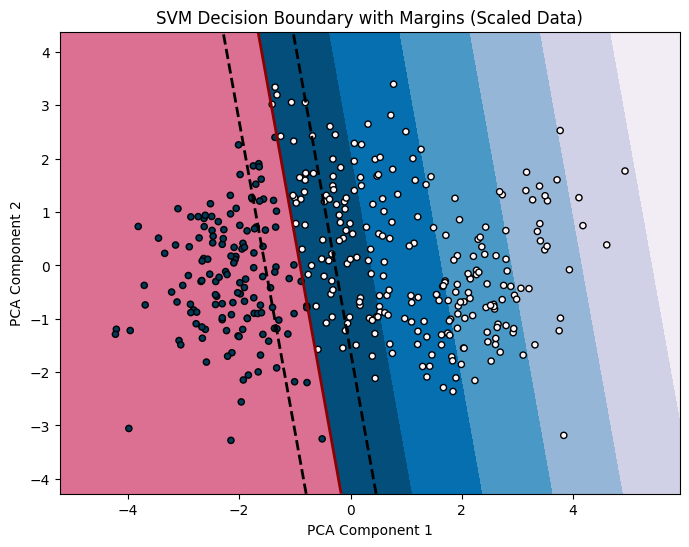

In [92]:
# Create a mesh to plot the decision boundary
h = .02  # step size in the mesh
x_min, x_max = X_pca_plot_test_scaled[:, 0].min() - 1, X_pca_plot_test_scaled[:, 0].max() + 1
y_min, y_max = X_pca_plot_test_scaled[:, 1].min() - 1, X_pca_plot_test_scaled[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Plot the decision boundary and margins
plt.figure(figsize=(8, 6))

# Plot decision boundary
Z = clf_svm.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 0, 7), cmap=plt.cm.PuBu)
a = plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='darkred')
plt.contourf(xx, yy, Z, levels=[0, Z.max()], colors='palevioletred')

# Plot the margin
plt.contour(xx, yy, Z, levels=[-1, 1], linewidths=2, colors='k', linestyles=['--', '--'])

# Plot the points
plt.scatter(X_pca_plot_test_scaled[:, 0], X_pca_plot_test_scaled[:, 1], c=y_pred_svm_scaled_linear, s=20, edgecolor='k', cmap=plt.cm.PuBu)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('SVM Decision Boundary with Margins (Scaled Data)')
plt.show()

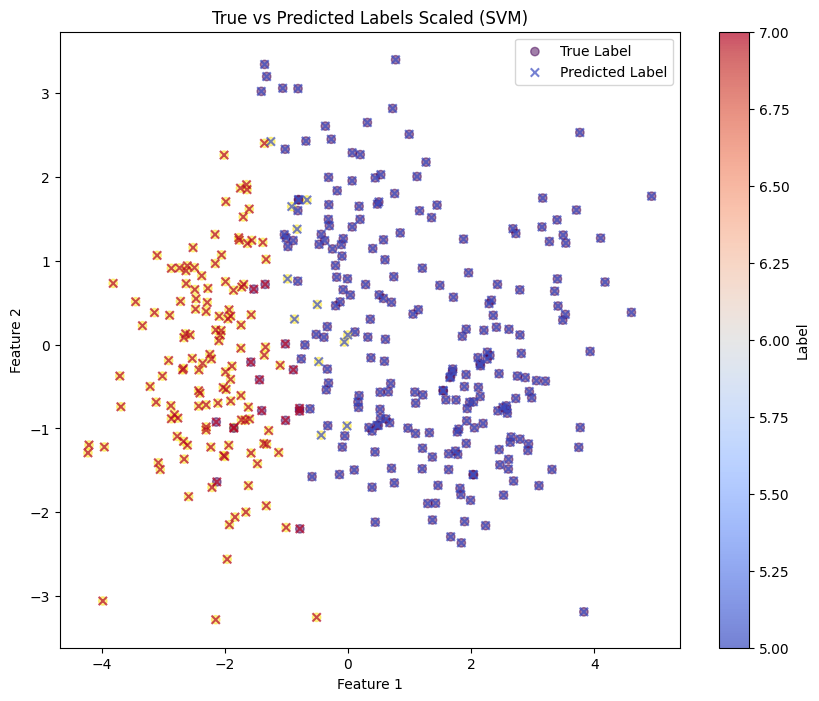

In [65]:
# Plot the data points with true labels
plt.figure(figsize=(10, 8))
plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', marker='o', label='True Label', alpha=0.5)

# Overlay the predicted labels
plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_pred_svm_scaled_linear, cmap='coolwarm', marker='x', label='Predicted Label', alpha=0.7)

plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.title("True vs Predicted Labels Scaled (SVM)")
plt.legend(['True Label', 'Predicted Label'])
plt.colorbar(label='Label')
plt.show()

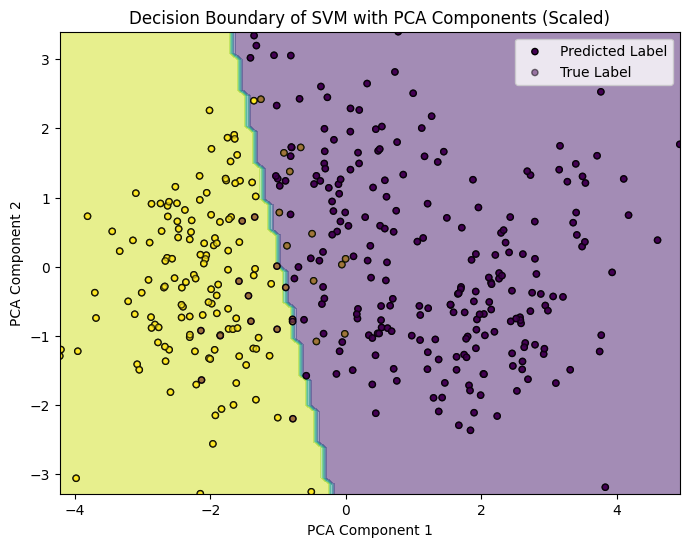

In [66]:
# Assuming X_test_pca contains the test data reduced to two PCA components
X_svm_plot_test_scaled = X_test_scaled[:, :2]

# Fit and plot model function
def fit_and_plot_model(X_pca_plot_test, y_pred, clf, ax):
    clf.fit(X_pca_plot_test, y_pred)
    disp = DecisionBoundaryDisplay.from_estimator(
        clf,
        X_pca_plot_test,
        response_method="predict",
        alpha=0.5,
        ax=ax,
    )
    ax.scatter(X_pca_plot_test[:, 0], X_pca_plot_test[:, 1], c=y_pred, s=20, edgecolor="k")
    ax.set_xlim((X_pca_plot_test[:, 0].min(), X_pca_plot_test[:, 0].max()))
    ax.set_ylim((X_pca_plot_test[:, 1].min(), X_pca_plot_test[:, 1].max()))
    return disp.ax_

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Call the function to fit and plot the model with unscaled PCA
fit_and_plot_model(X_svm_plot_test_scaled, y_pred_svm_scaled_linear, clf_svm, ax)

# Scatter the original test data points with true labels
ax.scatter(X_svm_plot_test_scaled[:, 0], X_svm_plot_test_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', s=20, marker='o', edgecolor='k', alpha=0.5, label='True Label')

# Set labels and title
ax.set_xlabel("PCA Component 1")
ax.set_ylabel("PCA Component 2")
ax.set_title("Decision Boundary of SVM with PCA Components (Scaled)")

# Show the legend
ax.legend(['Predicted Label', 'True Label'])

# Show the plot
plt.show()

#### kernel non-linear

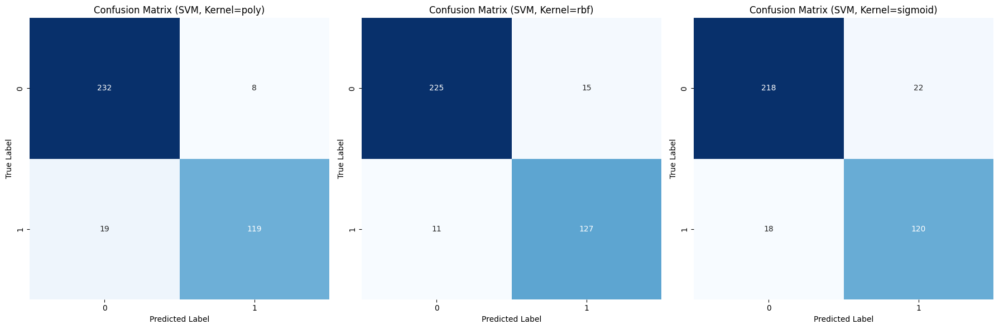

In [96]:
from sklearn.svm import SVC

# Define the kernels to be used
kernels = ['poly', 'rbf', 'sigmoid']

# Initialize lists to store confusion matrices, classification reports, and predictions
conf_matrices = []
class_reports = []
predictions = {}

# Train and evaluate SVM with different kernels
for kernel in kernels:
    clf_svm = SVC(kernel=kernel)
    clf_svm.fit(X_train_scaled, y_train_pca_scaled)
    y_pred_svm_scaled = clf_svm.predict(X_test_scaled)
    
    # Store predictions in a dictionary
    predictions[f'y_pred_svm_scaled_{kernel}'] = y_pred_svm_scaled
    
    # Compute the confusion matrix
    conf_matrix_svm_scaled = confusion_matrix(y_test_pca_scaled, y_pred_svm_scaled)
    conf_matrices.append((kernel, conf_matrix_svm_scaled))
    
    # Compute the classification report
    class_report_svm_scaled = classification_report(y_test_pca_scaled, y_pred_svm_scaled, output_dict=True)
    class_reports.append((kernel, class_report_svm_scaled))

# Plot the confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes = axes.ravel()

for idx, (kernel, conf_matrix) in enumerate(conf_matrices):
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[idx])
    axes[idx].set_title(f"Confusion Matrix (SVM, Kernel={kernel})")
    axes[idx].set_xlabel("Predicted Label")
    axes[idx].set_ylabel("True Label")

plt.tight_layout()
plt.show()



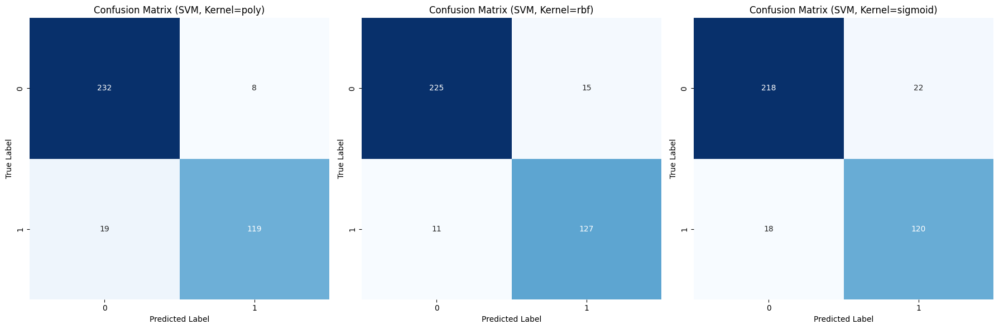

In [93]:
# Define the kernels to be used
kernels = ['poly', 'rbf', 'sigmoid']

# Initialize lists to store confusion matrices and classification reports
conf_matrices = []
class_reports = []

# Train and evaluate SVM with different kernels
for kernel in kernels:
    clf_svm = SVC(kernel=kernel)
    clf_svm.fit(X_train_scaled, y_train_pca_scaled)
    y_pred_svm_scaled = clf_svm.predict(X_test_scaled)
    
    # Compute the confusion matrix
    conf_matrix_svm_scaled = confusion_matrix(y_test_pca_scaled, y_pred_svm_scaled)
    conf_matrices.append((kernel, conf_matrix_svm_scaled))
    
    # Compute the classification report
    class_report_svm_scaled = classification_report(y_test_pca_scaled, y_pred_svm_scaled, output_dict=True)
    class_reports.append((kernel, class_report_svm_scaled))

# Plot the confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes = axes.ravel()

for idx, (kernel, conf_matrix) in enumerate(conf_matrices):
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[idx])
    axes[idx].set_title(f"Confusion Matrix (SVM, Kernel={kernel})")
    axes[idx].set_xlabel("Predicted Label")
    axes[idx].set_ylabel("True Label")

plt.tight_layout()
plt.show()


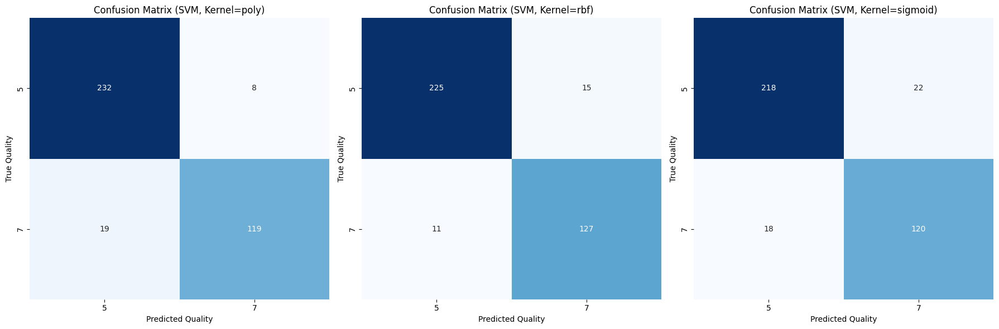

In [100]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report

# Define the kernels to be used
kernels = ['poly', 'rbf', 'sigmoid']

# Initialize lists to store confusion matrices and classification reports
conf_matrices = []
class_reports = []

# Train and evaluate SVM with different kernels
for kernel in kernels:
    clf_svm = SVC(kernel=kernel)
    clf_svm.fit(X_train_scaled, y_train_pca_scaled)
    y_pred_svm_scaled = clf_svm.predict(X_test_scaled)
    
    # Compute the confusion matrix
    conf_matrix_svm_scaled = confusion_matrix(y_test_pca_scaled, y_pred_svm_scaled)
    conf_matrices.append((kernel, conf_matrix_svm_scaled))
    
    # Compute the classification report
    class_report_svm_scaled = classification_report(y_test_pca_scaled, y_pred_svm_scaled, output_dict=True)
    class_reports.append((kernel, class_report_svm_scaled))

# Plot the confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes = axes.ravel()

for idx, (kernel, conf_matrix) in enumerate(conf_matrices):
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, ax=axes[idx], xticklabels=[5, 7], yticklabels=[5, 7])
    axes[idx].set_title(f"Confusion Matrix (SVM, Kernel={kernel})")
    axes[idx].set_xlabel("Predicted Quality")
    axes[idx].set_ylabel("True Quality")

plt.tight_layout()
plt.show()


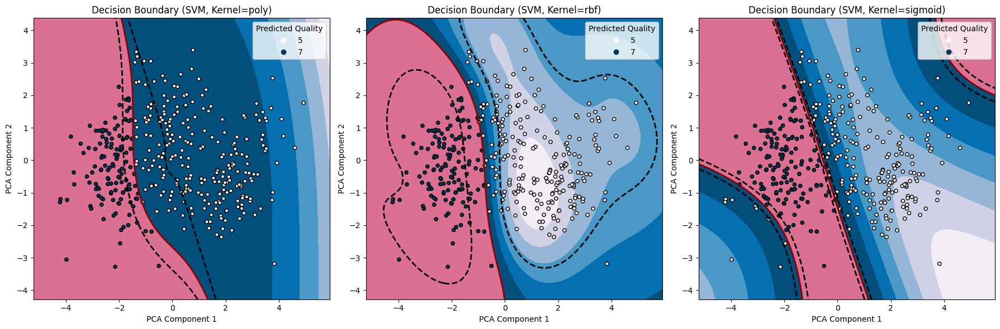

In [99]:
# Plot decision boundaries and margins for each kernel
X_pca_plot_test_scaled = X_test_scaled[:, :2]

# Create a mesh to plot the decision boundary
h = .02  # step size in the mesh
x_min, x_max = X_pca_plot_test_scaled[:, 0].min() - 1, X_pca_plot_test_scaled[:, 0].max() + 1
y_min, y_max = X_pca_plot_test_scaled[:, 1].min() - 1, X_pca_plot_test_scaled[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes = axes.ravel()

for idx, kernel in enumerate(kernels):
    clf_svm = SVC(kernel=kernel)
    clf_svm.fit(X_train_scaled, y_train_pca_scaled)
    
    Z = clf_svm.decision_function(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    ax = axes[idx]
    ax.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 0, 7), cmap=plt.cm.PuBu)
    ax.contour(xx, yy, Z, levels=[0], linewidths=2, colors='darkred')
    ax.contourf(xx, yy, Z, levels=[0, Z.max()], colors='palevioletred')
    ax.contour(xx, yy, Z, levels=[-1, 1], linewidths=2, colors='k', linestyles=['--', '--'])
    
    # Plot the points using the correct related predictions
    y_pred = predictions[f'y_pred_svm_scaled_{kernel}']
    scatter = ax.scatter(X_pca_plot_test_scaled[:, 0], X_pca_plot_test_scaled[:, 1], c=y_pred, s=20, edgecolor='k', cmap=plt.cm.PuBu)
    ax.set_xlabel('PCA Component 1')
    ax.set_ylabel('PCA Component 2')
    ax.set_title(f'Decision Boundary (SVM, Kernel={kernel})')
    
    # Add legend
    handles, labels = scatter.legend_elements()
    legend = ax.legend(handles, labels, title="Predicted Quality")

plt.tight_layout()
plt.show()

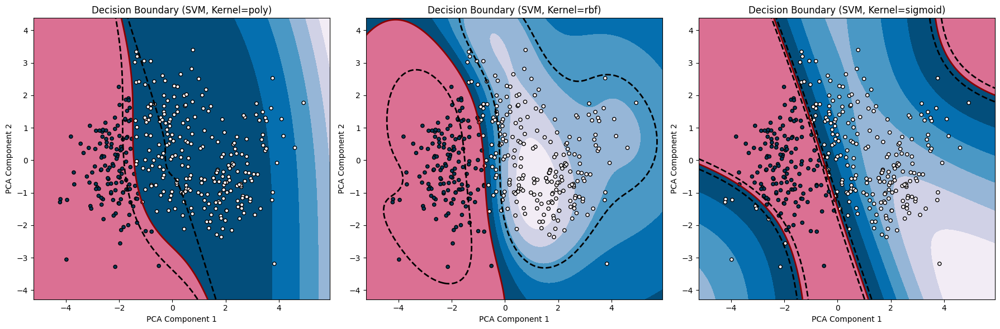

In [97]:
# Plot decision boundaries and margins for each kernel
X_pca_plot_test_scaled = X_test_scaled[:, :2]

# Create a mesh to plot the decision boundary
h = .02  # step size in the mesh
x_min, x_max = X_pca_plot_test_scaled[:, 0].min() - 1, X_pca_plot_test_scaled[:, 0].max() + 1
y_min, y_max = X_pca_plot_test_scaled[:, 1].min() - 1, X_pca_plot_test_scaled[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes = axes.ravel()

for idx, kernel in enumerate(kernels):
    clf_svm = SVC(kernel=kernel)
    clf_svm.fit(X_train_scaled, y_train_pca_scaled)
    
    Z = clf_svm.decision_function(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    ax = axes[idx]
    ax.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 0, 7), cmap=plt.cm.PuBu)
    ax.contour(xx, yy, Z, levels=[0], linewidths=2, colors='darkred')
    ax.contourf(xx, yy, Z, levels=[0, Z.max()], colors='palevioletred')
    ax.contour(xx, yy, Z, levels=[-1, 1], linewidths=2, colors='k', linestyles=['--', '--'])
    
    # Plot the points using the correct related predictions
    y_pred = predictions[f'y_pred_svm_scaled_{kernel}']
    scatter = ax.scatter(X_pca_plot_test_scaled[:, 0], X_pca_plot_test_scaled[:, 1], c=y_pred, s=20, edgecolor='k', cmap=plt.cm.PuBu)
    ax.set_xlabel('PCA Component 1')
    ax.set_ylabel('PCA Component 2')
    ax.set_title(f'Decision Boundary (SVM, Kernel={kernel})')

plt.tight_layout()
plt.show()

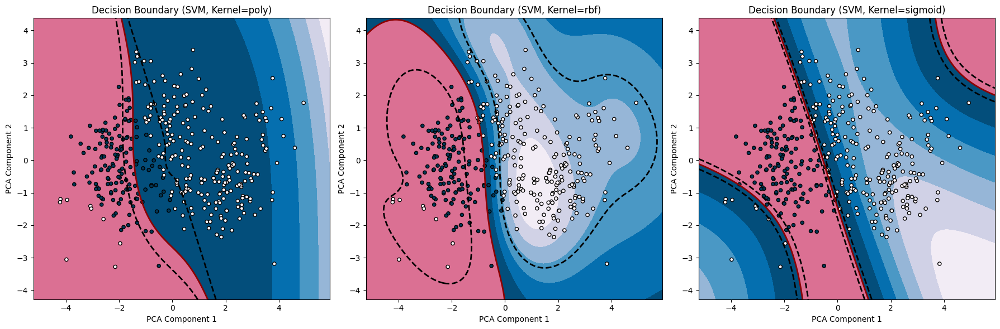

In [94]:
X_pca_plot_test_scaled = X_test_scaled[:, :2]

# Create a mesh to plot the decision boundary
h = .02  # step size in the mesh
x_min, x_max = X_pca_plot_test_scaled[:, 0].min() - 1, X_pca_plot_test_scaled[:, 0].max() + 1
y_min, y_max = X_pca_plot_test_scaled[:, 1].min() - 1, X_pca_plot_test_scaled[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Plot decision boundaries and margins for each kernel
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes = axes.ravel()

for idx, kernel in enumerate(kernels):
    clf_svm = SVC(kernel=kernel)
    clf_svm.fit(X_train_scaled, y_train_pca_scaled)
    
    Z = clf_svm.decision_function(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    ax = axes[idx]
    ax.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 0, 7), cmap=plt.cm.PuBu)
    ax.contour(xx, yy, Z, levels=[0], linewidths=2, colors='darkred')
    ax.contourf(xx, yy, Z, levels=[0, Z.max()], colors='palevioletred')
    ax.contour(xx, yy, Z, levels=[-1, 1], linewidths=2, colors='k', linestyles=['--', '--'])
    
    # Plot the points
    scatter = ax.scatter(X_pca_plot_test_scaled[:, 0], X_pca_plot_test_scaled[:, 1], c=y_pred_svm_scaled, s=20, edgecolor='k', cmap=plt.cm.PuBu)
    ax.set_xlabel('PCA Component 1')
    ax.set_ylabel('PCA Component 2')
    ax.set_title(f'Decision Boundary (SVM, Kernel={kernel})')

plt.tight_layout()
plt.show()

### Gaussian Mixture Model 

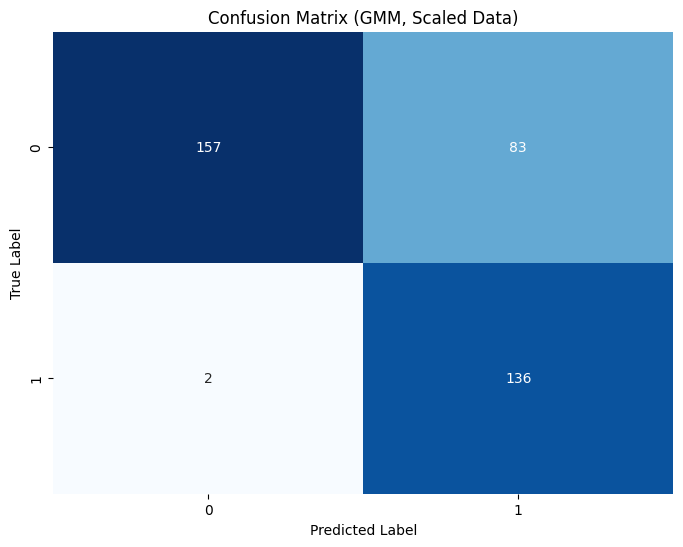

In [69]:
from sklearn.mixture import GaussianMixture
from scipy.stats import mode

# Create a Gaussian Mixture Model
gmm = GaussianMixture(n_components=len(np.unique(y_train_pca_scaled)), random_state=42)

# Fit the GMM model to the scaled training data
gmm.fit(X_train_scaled)

# Predict the clusters for the test data
y_clusters = gmm.predict(X_test_scaled)

# Map clusters to actual labels
def map_clusters_to_labels(y_clusters, y_true):
    labels = np.zeros_like(y_clusters)
    for i in range(len(np.unique(y_clusters))):
        mask = (y_clusters == i)
        labels[mask] = mode(y_true[mask])[0]
    return labels

# Get the predicted labels
y_pred_gmm_scaled = map_clusters_to_labels(y_clusters, y_test_pca_scaled)

# Confusion matrix for scaled data
conf_matrix_gmm_scaled = confusion_matrix(y_test_pca_scaled, y_pred_gmm_scaled)

# Classification report for scaled data
class_report_gmm_scaled = classification_report(y_test_pca_scaled, y_pred_gmm_scaled)

# Visualize confusion matrix for scaled data
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_gmm_scaled, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix (GMM, Scaled Data)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

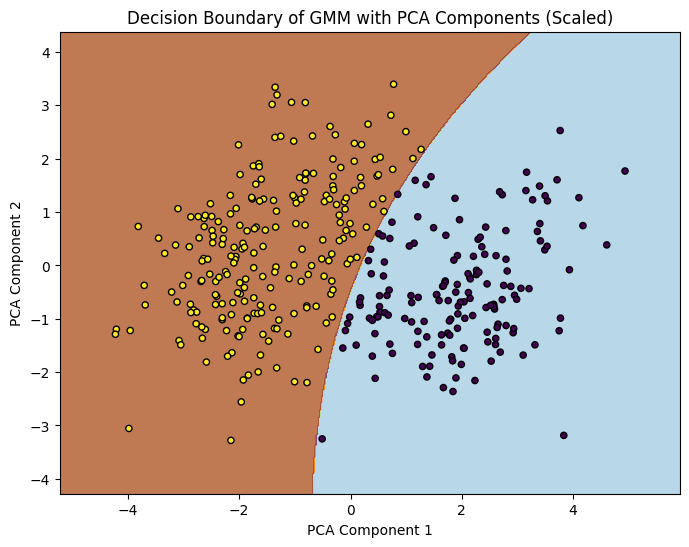

In [70]:
# Prepare data for plotting decision boundaries
X_svm_plot_test_scaled = X_test_scaled[:, :2]

# Create a mesh to plot the decision boundary
h = .02  # step size in the mesh
x_min, x_max = X_svm_plot_test_scaled[:, 0].min() - 1, X_svm_plot_test_scaled[:, 0].max() + 1
y_min, y_max = X_svm_plot_test_scaled[:, 1].min() - 1, X_svm_plot_test_scaled[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Predict cluster probabilities for each point in the mesh
Z = gmm.predict_proba(np.c_[xx.ravel(), yy.ravel()])

# Get the highest probability cluster for each point
Z = Z.argmax(axis=1)
Z = Z.reshape(xx.shape)

# Plot decision boundary
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.Paired)

# Scatter the original test data points with true labels
plt.scatter(X_svm_plot_test_scaled[:, 0], X_svm_plot_test_scaled[:, 1], c=y_pred_gmm_scaled, cmap='viridis', s=20, edgecolor='k')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Decision Boundary of GMM with PCA Components (Scaled)')
plt.show()

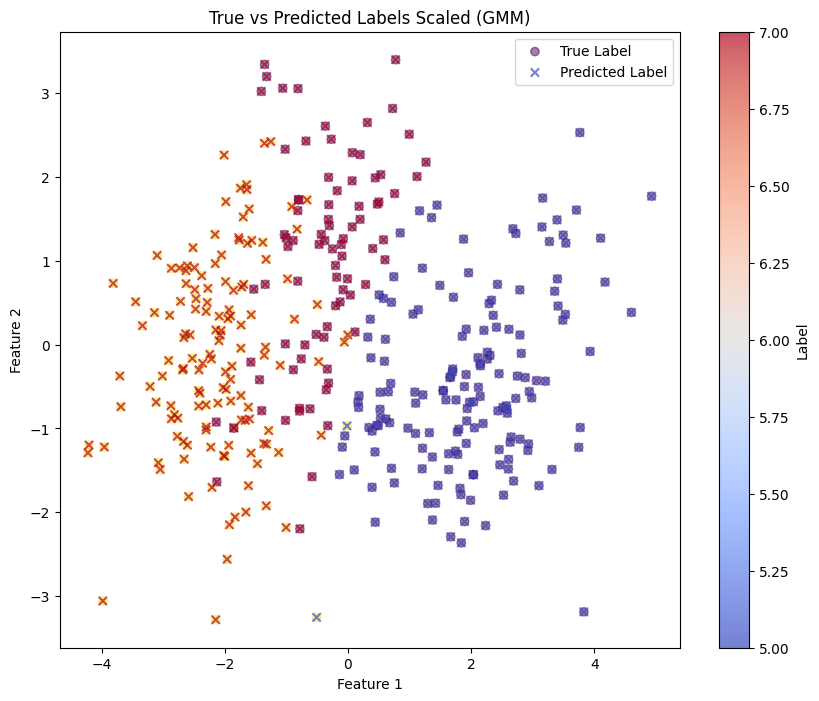

In [71]:
# Plot the data points with true labels
plt.figure(figsize=(10, 8))
plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', marker='o', label='True Label', alpha=0.5)

# Overlay the predicted labels (GMM)
plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_pred_gmm_scaled, cmap='coolwarm', marker='x', label='Predicted Label', alpha=0.7)

plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.title("True vs Predicted Labels Scaled (GMM)")
plt.legend(['True Label', 'Predicted Label'])
plt.colorbar(label='Label')
plt.show()

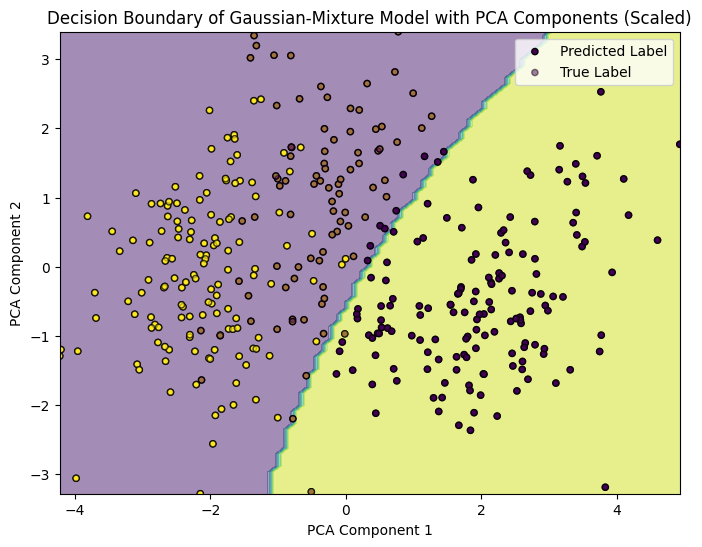

In [72]:
X_gmm_plot_test_scaled = X_test_scaled[:, :2]

# Create the SVM classifier
clf_svm = GaussianMixture(n_components=len(np.unique(y_train_pca_scaled)), random_state=42)

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Call the function to fit and plot the model with unscaled PCA
fit_and_plot_model(X_gmm_plot_test_scaled, y_pred_gmm_scaled, clf_svm, ax)

# Scatter the original test data points with true labels
ax.scatter(X_gmm_plot_test_scaled[:, 0], X_gmm_plot_test_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', s=20, marker='o', edgecolor='k', alpha=0.5, label='True Label')

# Set labels and title
ax.set_xlabel("PCA Component 1")
ax.set_ylabel("PCA Component 2")
ax.set_title("Decision Boundary of Gaussian-Mixture Model with PCA Components (Scaled)")

# Show the legend
ax.legend(['Predicted Label', 'True Label'])

# Show the plot
plt.show()

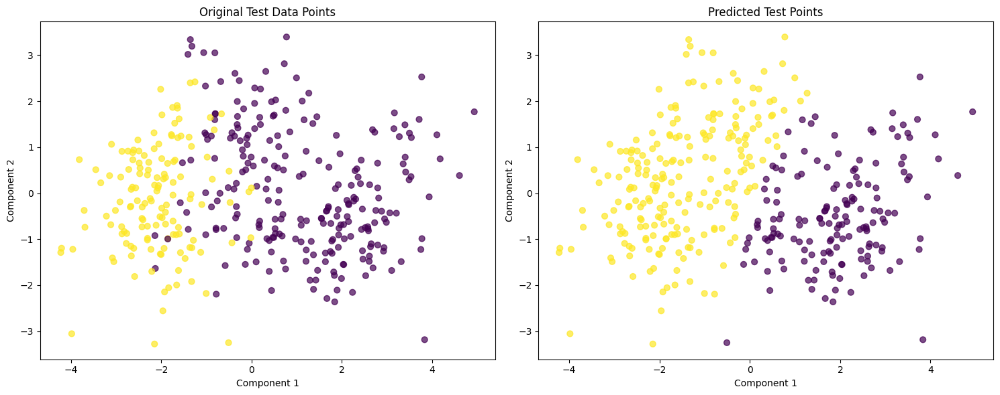

In [73]:
X_test_first_two_scaled = X_test_pca_scaled.iloc[:, :2].values

# Create the figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot the original test data points
axes[0].scatter(X_test_first_two_scaled[:, 0], X_test_first_two_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', s=40, alpha=0.7)
axes[0].set_title('Original Test Data Points')
axes[0].set_xlabel('Component 1')
axes[0].set_ylabel('Component 2')

# Plot the predicted test points
axes[1].scatter(X_test_first_two_scaled[:, 0], X_test_first_two_scaled[:, 1], c=y_pred_gmm_scaled, cmap='viridis', s=40, alpha=0.7)
axes[1].set_title('Predicted Test Points')
axes[1].set_xlabel('Component 1')
axes[1].set_ylabel('Component 2')

# Adjust layout
plt.tight_layout()
plt.show()

In [74]:
X_test_pca_scaled

,Component 1 (PCA),Component 2 (PCA))
76,2.814879,-0.104780
1026,-2.869317,0.909502
43,2.054275,-0.991592
666,3.772672,-0.988539
529,2.614862,0.182629
...,...,...
597,-2.147256,0.174563
879,-2.773698,-1.093689
1210,-1.835240,-2.056039
1165,0.575865,0.551018


In [75]:
X_gmm_test = X_test_pca_scaled
X_gmm_test['quality'] = y_pred_gmm_scaled

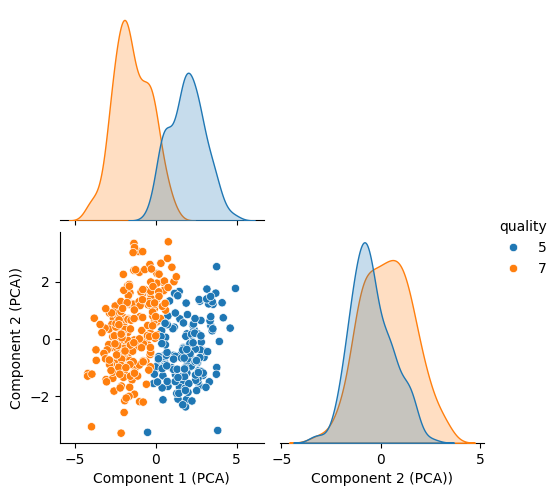

In [76]:
sns.pairplot(X_gmm_test, 
             hue='quality', 
             palette="tab10", 
             corner=True)

plt.show()

In [77]:
X_test_try = X_gmm_test
X_test_try['quality'] = y_test_pca_scaled

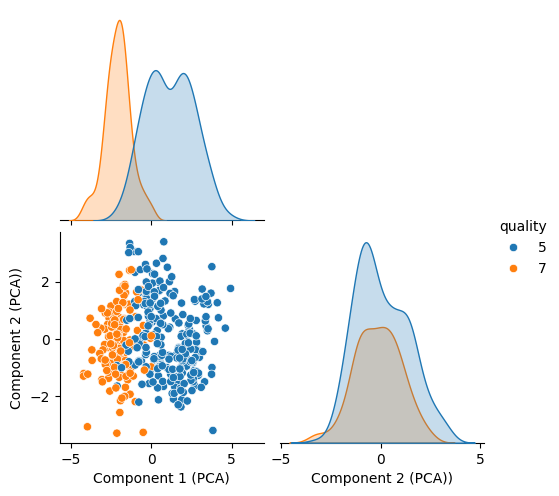

In [78]:
sns.pairplot(X_gmm_test, 
             hue='quality', 
             palette="tab10", 
             corner=True)

plt.show()

### Naive Bayes

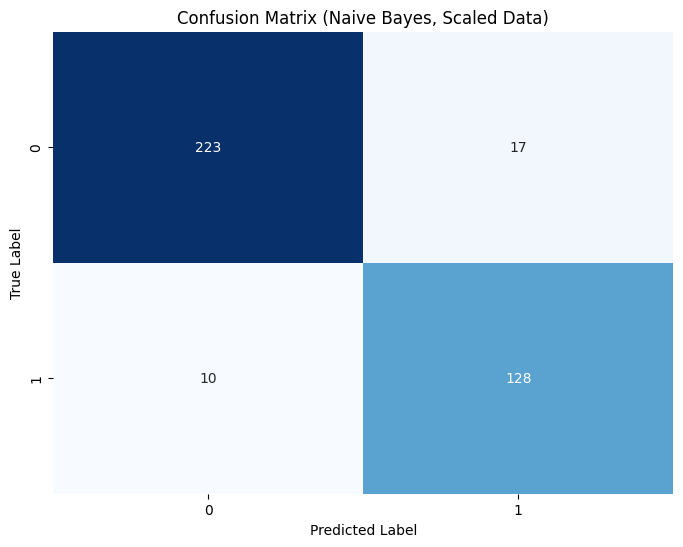

Classification Report (Naive Bayes, Scaled Data):
               precision    recall  f1-score   support

           5       0.96      0.93      0.94       240
           7       0.88      0.93      0.90       138

    accuracy                           0.93       378
   macro avg       0.92      0.93      0.92       378
weighted avg       0.93      0.93      0.93       378



In [79]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report

# Create a Naive Bayes classifier
nb = GaussianNB()

# Fit the Naive Bayes model to the scaled training data
nb.fit(X_train_scaled, y_train_pca_scaled)

# Predict the labels for the test data
y_pred_nb_scaled = nb.predict(X_test_scaled)

# Confusion matrix for scaled data
conf_matrix_nb_scaled = confusion_matrix(y_test_pca_scaled, y_pred_nb_scaled)

# Classification report for scaled data
class_report_nb_scaled = classification_report(y_test_pca_scaled, y_pred_nb_scaled)

# Visualize confusion matrix for scaled data
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_nb_scaled, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix (Naive Bayes, Scaled Data)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Print classification report
print("Classification Report (Naive Bayes, Scaled Data):\n", class_report_nb_scaled)

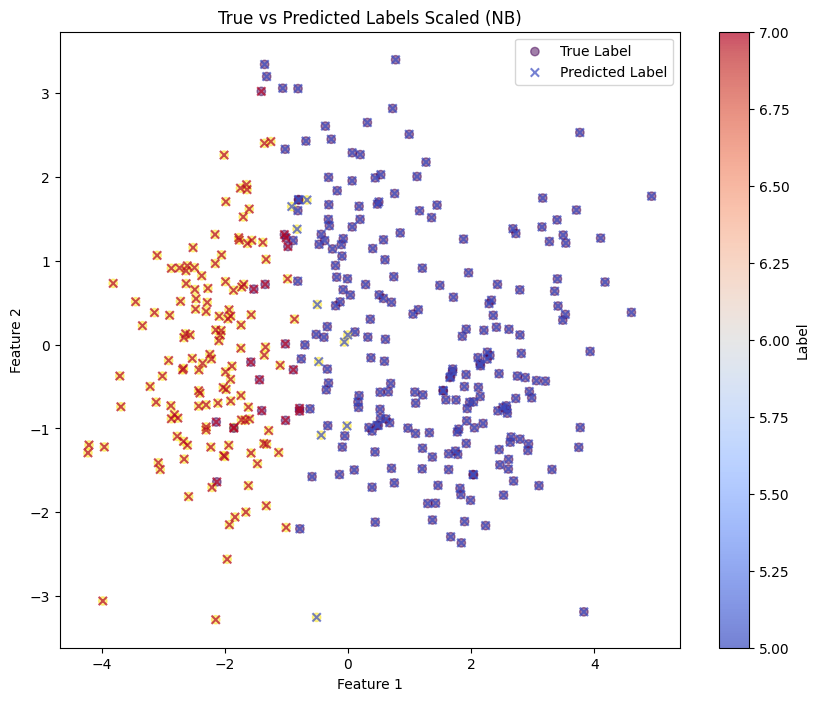

In [80]:
# Plot the data points with true labels
plt.figure(figsize=(10, 8))
plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', marker='o', label='True Label', alpha=0.5)

# Overlay the predicted labels (GMM)
plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_pred_nb_scaled, cmap='coolwarm', marker='x', label='Predicted Label', alpha=0.7)

plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.title("True vs Predicted Labels Scaled (NB)")
plt.legend(['True Label', 'Predicted Label'])
plt.colorbar(label='Label')
plt.show()

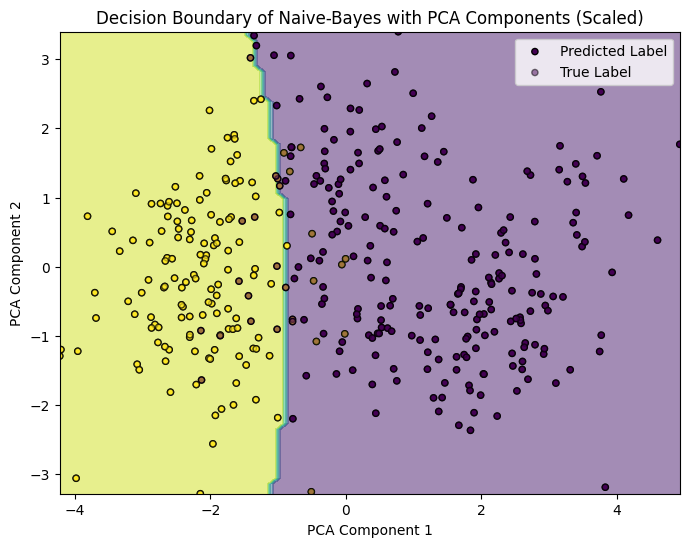

In [81]:
X_nb_plot_test_scaled = X_test_scaled[:, :2]

# Create the SVM classifier
clf_svm = GaussianNB()

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Call the function to fit and plot the model with unscaled PCA
fit_and_plot_model(X_nb_plot_test_scaled, y_pred_nb_scaled, clf_svm, ax)

# Scatter the original test data points with true labels
ax.scatter(X_nb_plot_test_scaled[:, 0], X_nb_plot_test_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', s=20, marker='o', edgecolor='k', alpha=0.5, label='True Label')

# Set labels and title
ax.set_xlabel("PCA Component 1")
ax.set_ylabel("PCA Component 2")
ax.set_title("Decision Boundary of Naive-Bayes with PCA Components (Scaled)")

# Show the legend
ax.legend(['Predicted Label', 'True Label'])

# Show the plot
plt.show()

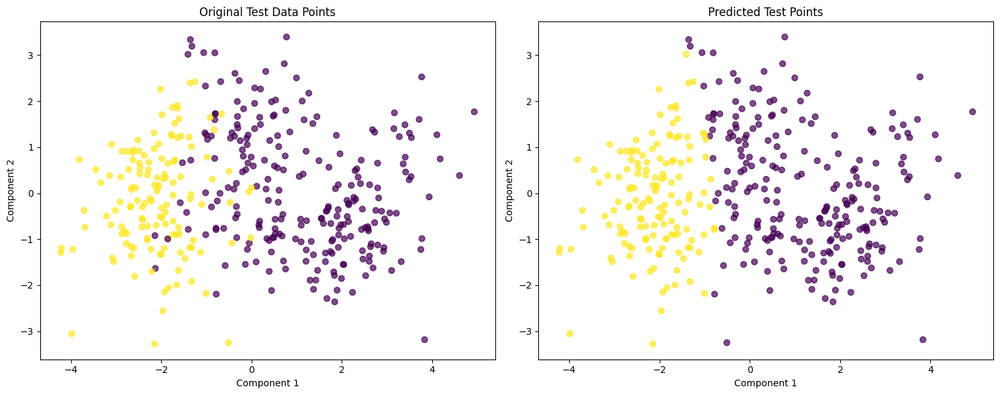

In [82]:
X_test_first_two_scaled = X_test_pca_scaled.iloc[:, :2].values

# Create the figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot the original test data points
axes[0].scatter(X_test_first_two_scaled[:, 0], X_test_first_two_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', s=40, alpha=0.7)
axes[0].set_title('Original Test Data Points')
axes[0].set_xlabel('Component 1')
axes[0].set_ylabel('Component 2')

# Plot the predicted test points
axes[1].scatter(X_test_first_two_scaled[:, 0], X_test_first_two_scaled[:, 1], c=y_pred_nb_scaled, cmap='viridis', s=40, alpha=0.7)
axes[1].set_title('Predicted Test Points')
axes[1].set_xlabel('Component 1')
axes[1].set_ylabel('Component 2')

# Adjust layout
plt.tight_layout()
plt.show()

### k-Means

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



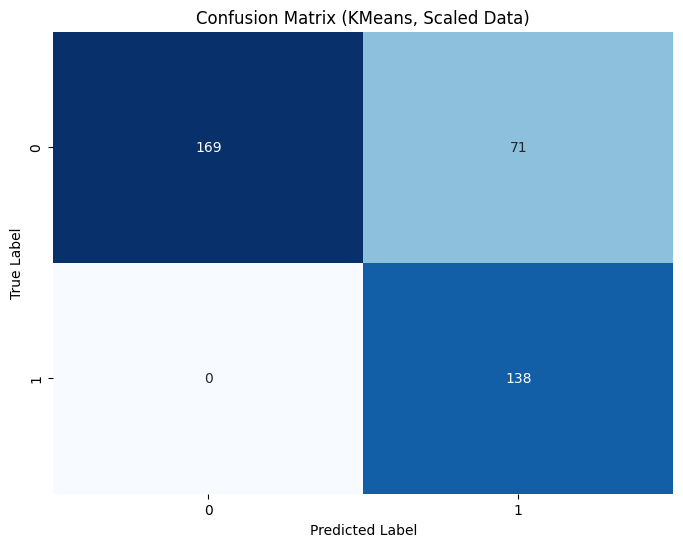

Classification Report (KMeans, Scaled Data):
               precision    recall  f1-score   support

           5       1.00      0.70      0.83       240
           7       0.66      1.00      0.80       138

    accuracy                           0.81       378
   macro avg       0.83      0.85      0.81       378
weighted avg       0.88      0.81      0.82       378



In [83]:
from sklearn.cluster import KMeans

# Create a KMeans model with 2 clusters
kmeans = KMeans(n_clusters=2, random_state=42)

# Fit the KMeans model to the scaled training data
kmeans.fit(X_train_scaled)

# Predict the clusters for the test data
y_clusters = kmeans.predict(X_test_scaled)

# Map clusters to actual labels
def map_clusters_to_labels(y_clusters, y_true):
    labels = np.zeros_like(y_clusters)
    for i in range(len(np.unique(y_clusters))):
        mask = (y_clusters == i)
        if np.any(mask):
            labels[mask] = mode(y_true[mask])[0]
    return labels

# Get the predicted labels
y_pred_kmeans_scaled = map_clusters_to_labels(y_clusters, y_test_pca_scaled)

# Confusion matrix for scaled data
conf_matrix_kmeans_scaled = confusion_matrix(y_test_pca_scaled, y_pred_kmeans_scaled)

# Classification report for scaled data
class_report_kmeans_scaled = classification_report(y_test_pca_scaled, y_pred_kmeans_scaled)

# Visualize confusion matrix for scaled data
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_kmeans_scaled, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix (KMeans, Scaled Data)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Print classification report
print("Classification Report (KMeans, Scaled Data):\n", class_report_kmeans_scaled)

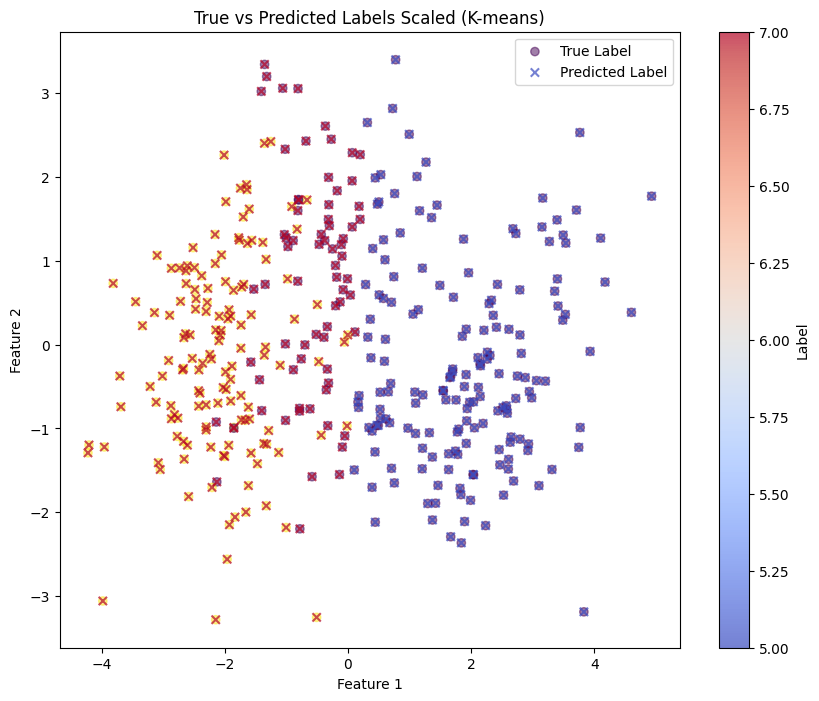

In [84]:
# Plot the data points with true labels
plt.figure(figsize=(10, 8))
plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', marker='o', label='True Label', alpha=0.5)

# Overlay the predicted labels (GMM)
plt.scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], c=y_pred_kmeans_scaled, cmap='coolwarm', marker='x', label='Predicted Label', alpha=0.7)

plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.title("True vs Predicted Labels Scaled (K-means)")
plt.legend(['True Label', 'Predicted Label'])
plt.colorbar(label='Label')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



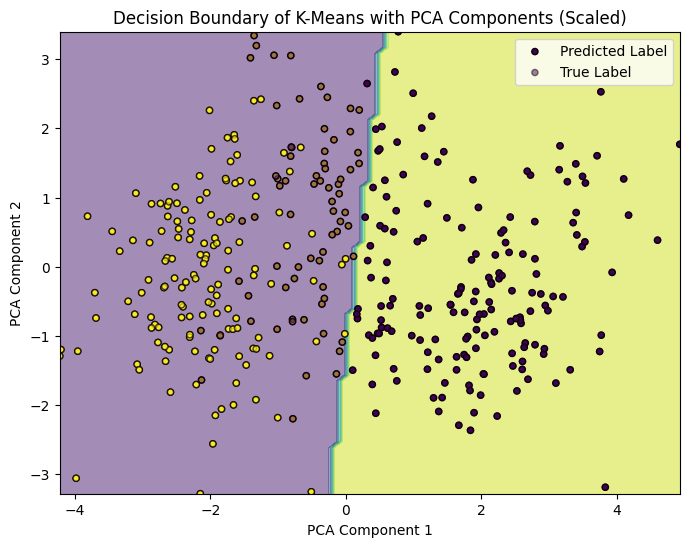

In [85]:
X_kmeans_plot_test_scaled = X_test_scaled[:, :2]

# Create the SVM classifier
clf_svm = KMeans(n_clusters=2)

# Create figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Call the function to fit and plot the model with unscaled PCA
fit_and_plot_model(X_kmeans_plot_test_scaled, y_pred_kmeans_scaled, clf_svm, ax)

# Scatter the original test data points with true labels
ax.scatter(X_kmeans_plot_test_scaled[:, 0], X_kmeans_plot_test_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', s=20, marker='o', edgecolor='k', alpha=0.5, label='True Label')

# Set labels and title
ax.set_xlabel("PCA Component 1")
ax.set_ylabel("PCA Component 2")
ax.set_title("Decision Boundary of K-Means with PCA Components (Scaled)")

# Show the legend
ax.legend(['Predicted Label', 'True Label'])

# Show the plot
plt.show()

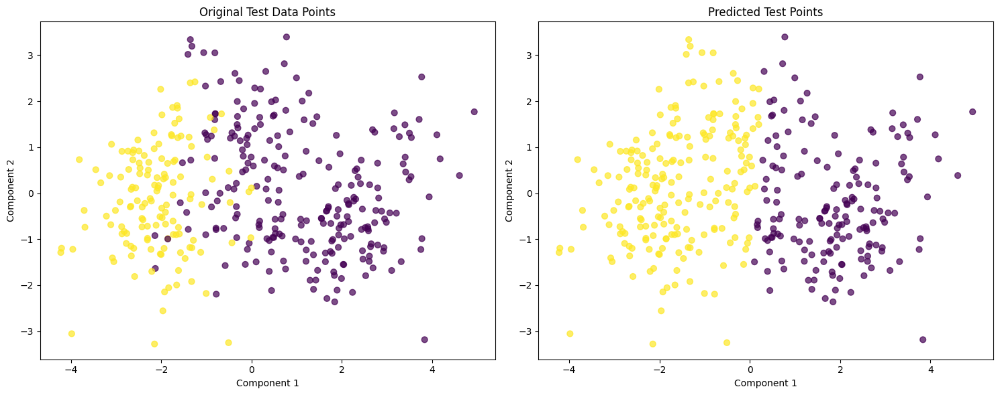

In [86]:
X_test_first_two_scaled = X_test_pca_scaled.iloc[:, :2].values

# Create the figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot the original test data points
axes[0].scatter(X_test_first_two_scaled[:, 0], X_test_first_two_scaled[:, 1], c=y_test_pca_scaled, cmap='viridis', s=40, alpha=0.7)
axes[0].set_title('Original Test Data Points')
axes[0].set_xlabel('Component 1')
axes[0].set_ylabel('Component 2')

# Plot the predicted test points
axes[1].scatter(X_test_first_two_scaled[:, 0], X_test_first_two_scaled[:, 1], c=y_pred_kmeans_scaled, cmap='viridis', s=40, alpha=0.7)
axes[1].set_title('Predicted Test Points')
axes[1].set_xlabel('Component 1')
axes[1].set_ylabel('Component 2')

# Adjust layout
plt.tight_layout()
plt.show()

## Comparison

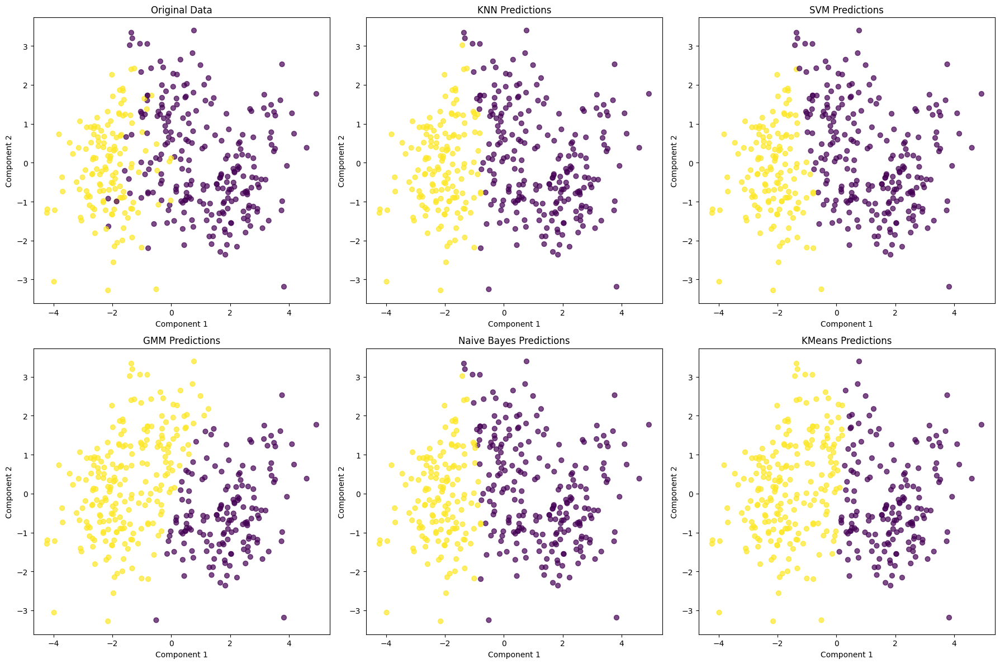

In [87]:
# Define a list of colors
colors = [y_test_pca_scaled, y_pred_scaled, y_pred_svm_scaled_linear, y_pred_gmm_scaled, y_pred_nb_scaled, y_pred_kmeans_scaled]
titles = ['Original Data', 'KNN Predictions', 'SVM Predictions', 'GMM Predictions', 'Naive Bayes Predictions', 'KMeans Predictions']
# Create a 5-subplot grid
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Plot the predicted test points on each subplot with different colors
for i, ax in enumerate(axes.flatten()):
    color_index = i % len(colors)  # Cycle through colors
    ax.scatter(X_test_first_two_scaled[:, 0], X_test_first_two_scaled[:, 1], c=colors[color_index], s=40, alpha=0.7)
    ax.set_title(titles[color_index])
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')

# Adjust layout
plt.tight_layout()
plt.show()